<a href="https://colab.research.google.com/github/paulmyr/DD2365-AdvancedCFD/blob/master/project/template-report-Navier-Stokes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations**
**Johan Hoffman**

# **Abstract**

This short report show an example on how to use FEniCS to solve the Navier-Stokes equations, which is used in the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [ ]:
# This program is an example file for the course
# DD2365 Advanced Computation in Fluid Mechanics,
# KTH Royal Institute of Technology, Stockholm, Sweden.

# Copyright (C) 2020 Johan Hoffman (jhoffman@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

# **Set up environment**

In [ ]:
# Load neccessary modules.
from google.colab import files

import numpy as np
np.random.seed(42)
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install-release-real.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin

from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that

$(\dot u + (u\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term.

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula:

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization,

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder).

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g.

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**

**Define domain and mesh**

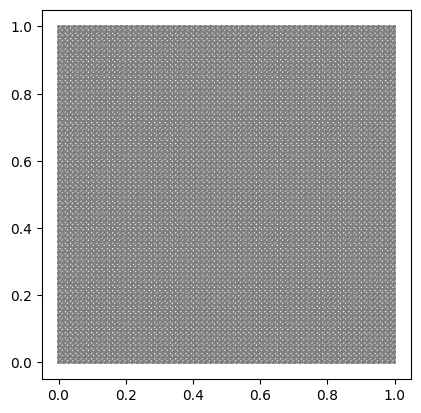

In [ ]:
# Define rectangular domain
L = 1
H = 1

# Define circle
xc = 0.5*L
yc = 0.5*H
rc = 0.25

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0)

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)

left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh)
resolution = 128
mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
#mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

# Define periodic domain
class PeriodicBoundary(SubDomain):
    # Left boundary is "target domain" G
    def inside(self, x, on_boundary):
        return bool(x[0] < DOLFIN_EPS and x[0] > -DOLFIN_EPS and on_boundary)

    # Map right boundary (H) to left boundary (G)
    def map(self, x, y):
        y[0] = x[0] - L
        y[1] = x[1]

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces**

In [ ]:
# Generate finite element spaces (for velocity and pressure)
V = VectorFunctionSpace(mesh, "Lagrange", 1, constrained_domain=PeriodicBoundary())
Q = FunctionSpace(mesh, "Lagrange", 1, constrained_domain=PeriodicBoundary())

# Define trial and test functions
u = TrialFunction(V)
p = TrialFunction(Q)
v = TestFunction(V)
q = TestFunction(Q)

**Define boundary conditions**

In [ ]:
# Define boundary conditions
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeftPassive(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) and abs(x[1] - yc) > rc

class DirichletBoundaryLeftActive(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) and abs(x[1] - yc) <= rc

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0)

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary, L=L):
        return on_boundary and near(x[0], L)

class DirichletBoundaryRightActive(SubDomain):
    def inside(self, x, on_boundary, L=L):
        return on_boundary and near(x[0], L) and abs(x[1] - yc) <= rc

class DirichletBoundaryRightPassive(SubDomain):
    def inside(self, x, on_boundary, L=L):
        return on_boundary and near(x[0], L) and abs(x[1] - yc) > rc

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_left_active = DirichletBoundaryLeftActive()
dbc_left_passive = DirichletBoundaryLeftPassive()
dbc_right = DirichletBoundaryRight()
dbc_right_active = DirichletBoundaryRightActive()
dbc_right_passive = DirichletBoundaryRightPassive()

# Examples of time dependent and stationary inflow conditions
#uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
#uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)

# Generate Initial Conditions - opposite moving streams with perturbation
w0 = 0.1
sigma = 0.05 / np.sqrt(2.0)

vx = Expression(f"-0.5 + (abs(x[1] - 0.5) <= {rc})", element = V.sub(0).ufl_element())
vy = Expression(f"0.1 * sin(4 * pi * x[0]) * (exp(-((x[1] - {rc}) * (x[1] - {rc})) / (2 * {sigma}*{sigma})) + exp(-((x[1] - {1-rc}) *(x[1] - {1-rc})) / (2 * {sigma}*{sigma})))", element = V.sub(1).ufl_element())
# uin = Expression((f"-0.5 + (abs(x[1] - 0.5) <= {rc})",
#                   f"0.1 * sin(4 * pi * x[0]) * (exp(-((x[1] - {rc}) * (x[1] - {rc})) / (2 * {sigma}*{sigma})) + exp(-((x[1] - {1-rc}) *(x[1] - {1-rc})) / (2 * {sigma}*{sigma})))"), element = V.ufl_element())


uin = 4.0
bcu_in0_active = DirichletBC(V.sub(0), vx, dbc_left_active)
bcu_in1_active = DirichletBC(V.sub(1), 0.0, dbc_left_active)
bcu_in0_passive = DirichletBC(V.sub(0), vx, dbc_left_passive)
bcu_in1_passive = DirichletBC(V.sub(1), 0.0, dbc_left_passive)
bcu_out0_active = DirichletBC(V.sub(0), vx, dbc_right_active)
bcu_out1_active = DirichletBC(V.sub(1), 0.0, dbc_right_active)
bcu_out0_passive = DirichletBC(V.sub(0), vx, dbc_right_passive)
bcu_out1_passive = DirichletBC(V.sub(1), 0.0, dbc_right_passive)
bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)

# pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
pin = 2.5
pout = 0.0
#bcp0 = DirichletBC(Q, pin, dbc_left)
bcp1 = DirichletBC(Q, pout, dbc_right)
bcp2 = DirichletBC(Q, pout, dbc_left)
bcp3 = DirichletBC(Q, pout, dbc_lower)
bcp4 = DirichletBC(Q, pout, dbc_upper)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
#bcu = [bcu_in0_active, bcu_in0_passive, bcu_in1_active, bcu_in1_passive, \
#       bcu_out0_active, bcu_out0_passive, bcu_out1_active, bcu_out1_passive, \
#       bcu_upp1, bcu_low1]
# bcp = [bcp1, bcp2, bcp3, bcp4]
# bcp = [bcp3, bcp4]

bcu = [bcu_upp1, bcu_low1]  # free slip boundary condition on top and bottom
bcp = []

# Define measure for boundary integration
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

# **Results**

**Define flow parameters**

In [ ]:
# Set viscosity
nu = 4.0e-5

**Define method parameters**

In [ ]:
# Define iteration functions
# (u0,p0) solution from previous time step
# (u1,p1) linearized solution at present time step
u0 = Function(V)
u1 = Function(V)
p0 = Function(Q)
p1 = Function(Q)

u0_fvm = Expression((f"-0.5 + (abs(x[1] - 0.5) <= {rc})",
                     f"0.1 * sin(4 * pi * x[0]) * (exp(-((x[1] - {rc}) * (x[1] - {rc})) / (2 * {sigma}*{sigma})) + exp(-((x[1] - {1-rc}) *(x[1] - {1-rc})) / (2 * {sigma}*{sigma})))"), element = V.ufl_element())


# u0.interpolate(Expression((f"{uin} * (abs(x[1] - {yc}) <= {rc}) - {uin} * (abs(x[1] - {yc}) > {rc})", f"{np.random.normal(0.0, 0.1)}"), degree=1))
u0.interpolate(u0_fvm)
p0.interpolate(Expression((f"{pin}"), degree=1))

# Set parameters for nonlinear and lienar solvers
num_nnlin_iter = 5
prec = "amg" if has_krylov_solver_preconditioner("amg") else "default"

# Time step length
dt = 0.5*mesh.hmin()

**Define variational problem**

In [ ]:
# Define variational problem

# Stabilization parameters
h = CellDiameter(mesh);
u_mag = sqrt(dot(u1,u1))
d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
d2 = h*u_mag

# Mean velocities for trapozoidal time stepping
um = 0.5*(u + u0)
um1 = 0.5*(u1 + u0)

# Momentum variational equation on residual form
Fu = inner((u - u0)/dt + grad(um)*um1, v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
    + d1*inner((u - u0)/dt + grad(um)*um1 + grad(p1), grad(v)*um1)*dx + d2*div(um)*div(v)*dx
au = lhs(Fu)
Lu = rhs(Fu)

# Continuity variational equation on residual form
# Fp = d1*inner((u1 - u0)/dt + grad(um1)*um1 + grad(p), grad(q))*dx + div(um1)*q*dx
# adding mass matrix.
alpha = 10 ** -2
Fp = d1*inner((u1 - u0)/dt + grad(um1)*um1 + grad(p), grad(q))*dx + div(um1)*q*dx + alpha*p*q*dx
ap = lhs(Fp)
Lp = rhs(Fp)

**Triple decomposition**

In [ ]:
import scipy.linalg.lapack as la
import numpy as np

def triple_decomposition(grad_u):
    new_grad = np.array([[0,0,0],
                         [0,0,0],
                         [0,0,0]])
    for i in range(2):
      for j in range(2):
        new_grad[i,j] = grad_u[i,j]
    def dselect(arg1,arg2): return (arg2==0)
    T = la.dgees(dselect,new_grad,sort_t = 1)[0]
    sh = np.linalg.norm([T[0,1],T[0,2],T[1,2]+T[2,1]])
    el = np.linalg.norm(np.diag(T))
    rr = np.sqrt(2*min(abs(T[1,2]),abs(T[2,1]))**2)
    return sh, el, rr

**Set plotting variables and open export files**

In [ ]:
# Open files to export solution to Paraview
file_u = File("results-NS/u.pvd")
file_p = File("results-NS/p.pvd")

**Time stepping algorithm**

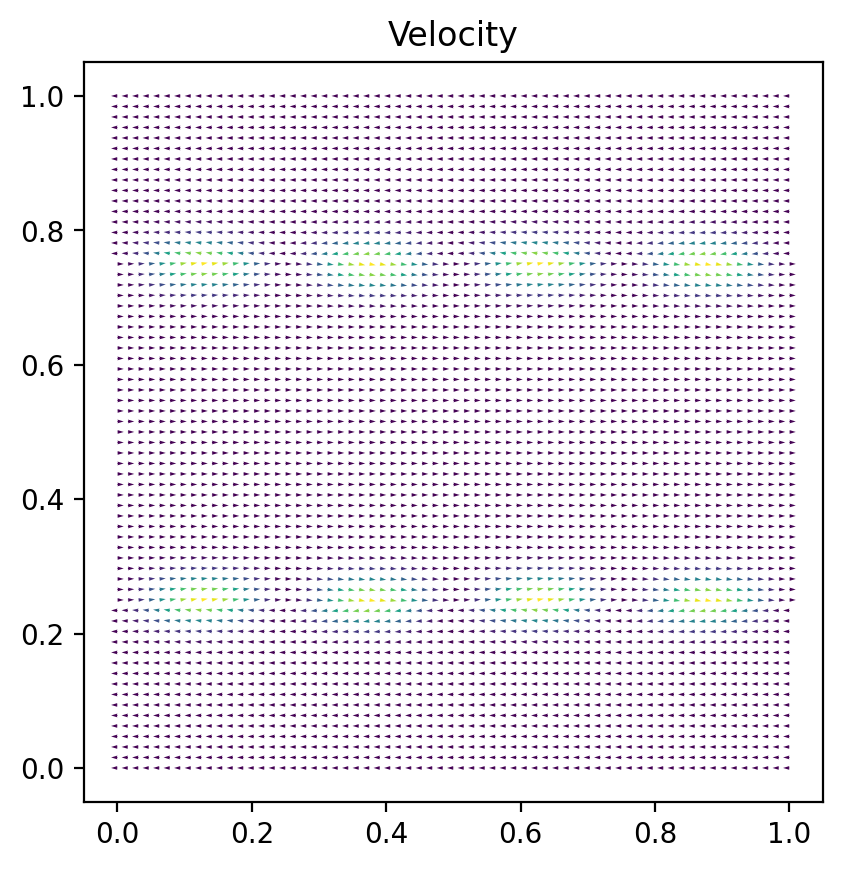

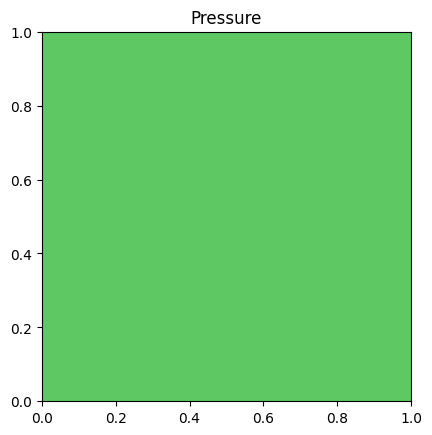

Time t = 0.011048543456039806
Calling FFC just-in-time (JIT) compiler, this may take some time.


Level 25:FFC:Calling FFC just-in-time (JIT) compiler, this may take some time.
INFO:FFC:Compiling element ffc_element_60856b971d2756a0957f9b0cefe633756751d227

INFO:FFC:Compiler stage 1: Analyzing element(s)
INFO:FFC:--------------------------------------
INFO:FFC:  
INFO:FFC:Compiler stage 1 finished in 0.0154483 seconds.

INFO:FFC:Compiler stage 2: Computing intermediate representation
INFO:FFC:-------------------------------------------------------
INFO:FFC:  Computing representation of 1 elements
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
INFO:FFC:  Computing representation of 1 dofmaps
DEBUG:FFC:  Reusing element from cache
INFO:FFC:  Computing representation of 0 coordinate mappings
INFO:FFC:  Computing representation of integrals
INFO:FFC:  Computing representation of forms
INFO:FFC:  
INFO:FFC:Compiler stage 2 finished in 0.3048

Calling FFC just-in-time (JIT) compiler, this may take some time.


Level 25:FFC:Calling FFC just-in-time (JIT) compiler, this may take some time.
INFO:FFC:Compiling form ffc_form_df4974541618efa7c29e1841ae7345b728ab315f

INFO:FFC:Compiler stage 1: Analyzing form(s)
INFO:FFC:-----------------------------------
DEBUG:FFC:  Preprocessing form using 'uflacs' representation family.
INFO:FFC:  
INFO:FFC:  Geometric dimension:       2
  Number of cell subdomains: 0
  Rank:                      2
  Arguments:                 '(v_0, v_1)'
  Number of coefficients:    0
  Coefficients:              '[]'
  Unique elements:           'Tensor<(2, 2) x CG1(?,?)>, Vector<2 x CG1(?,?)>'
  Unique sub elements:       'Tensor<(2, 2) x CG1(?,?)>, Vector<2 x CG1(?,?)>, CG1(?
                             ,?)'
  
INFO:FFC:  representation:    auto --> uflacs
INFO:FFC:  quadrature_rule:   auto --> default
INFO:FFC:  quadrature_degree: auto --> 2
INFO:FFC:  quadrature_degree: 2
INFO:FFC:  
INFO:FFC:Compiler stage 1 finished in 0.216729 seconds.

INFO:FFC:Compiler stage 2: Com

Calling FFC just-in-time (JIT) compiler, this may take some time.


Level 25:FFC:Calling FFC just-in-time (JIT) compiler, this may take some time.
INFO:FFC:Compiling element ffc_element_52d4afb178c727f026ec59fd3990708e81e7f6e5

INFO:FFC:Compiler stage 1: Analyzing element(s)
INFO:FFC:--------------------------------------
INFO:FFC:  
INFO:FFC:Compiler stage 1 finished in 0.00241494 seconds.

INFO:FFC:Compiler stage 2: Computing intermediate representation
INFO:FFC:-------------------------------------------------------
INFO:FFC:  Computing representation of 1 elements
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
DEBUG:FFC:  Reusing element from cache
INFO:FFC:  Computing representation of 1 dofmaps
DEBUG:FFC:  Reusing element from cache
INFO:FFC:  Computing representation of 0 coordinate mappings
INFO:FFC:  Computing representation of integrals
INFO:FFC:  Computing representation of forms
INFO:FFC:  
INFO:FFC:Compiler stage 2 finished in 0.0437765 seconds.

INFO:FFC:Compiler stage 3: Optimizing intermediate representati

Calling FFC just-in-time (JIT) compiler, this may take some time.


Level 25:FFC:Calling FFC just-in-time (JIT) compiler, this may take some time.
INFO:FFC:Compiling form ffc_form_1182f7a00f224b546de5b3312edc4d1b9ca8764f

INFO:FFC:Compiler stage 1: Analyzing form(s)
INFO:FFC:-----------------------------------
DEBUG:FFC:  Preprocessing form using 'uflacs' representation family.
INFO:FFC:  
INFO:FFC:  Geometric dimension:       2
  Number of cell subdomains: 0
  Rank:                      1
  Arguments:                 '(v_0)'
  Number of coefficients:    1
  Coefficients:              '[f_46]'
  Unique elements:           'Tensor<(2, 2) x CG1(?,?)>, Vector<2 x CG1(?,?)>'
  Unique sub elements:       'Tensor<(2, 2) x CG1(?,?)>, Vector<2 x CG1(?,?)>, CG1(?
                             ,?)'
  
INFO:FFC:  representation:    auto --> uflacs
INFO:FFC:  quadrature_rule:   auto --> default
INFO:FFC:  quadrature_degree: auto --> 1
INFO:FFC:  quadrature_degree: 1
INFO:FFC:  
INFO:FFC:Compiler stage 1 finished in 0.0371246 seconds.

INFO:FFC:Compiler stage 2: Com

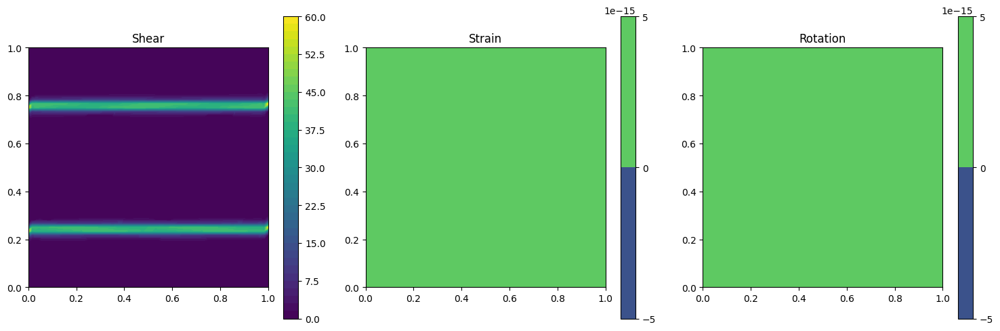

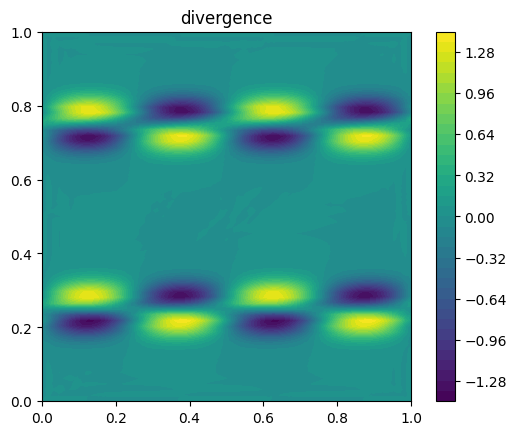

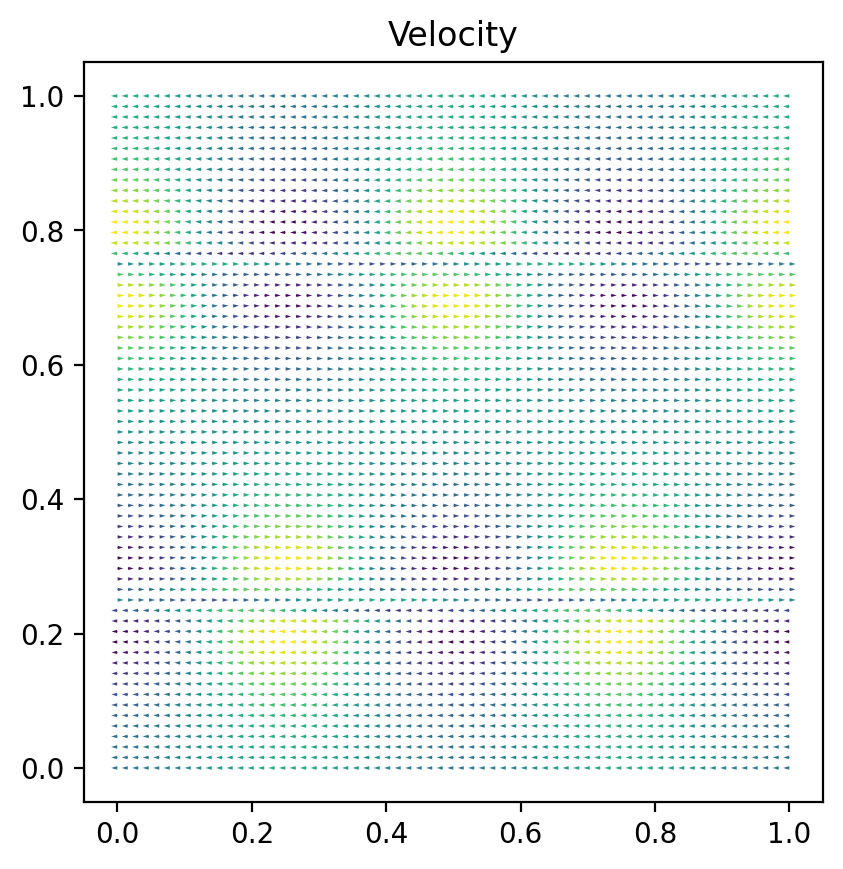

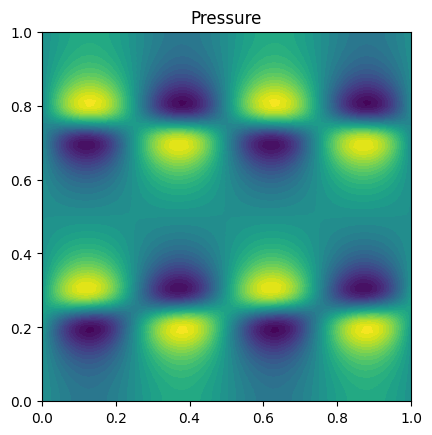

Time t = 0.11048543456039808


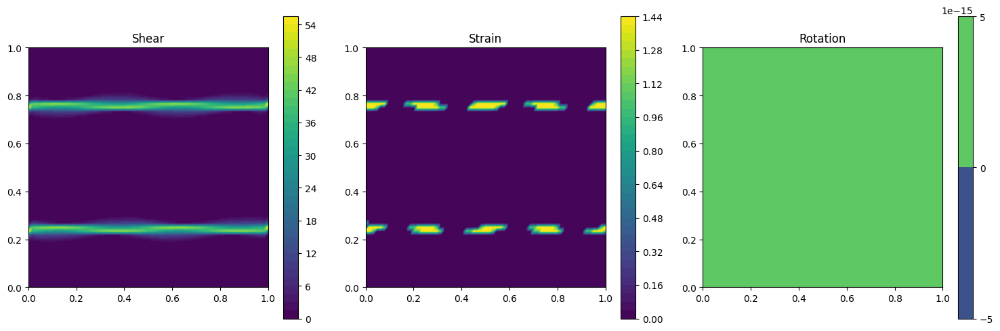

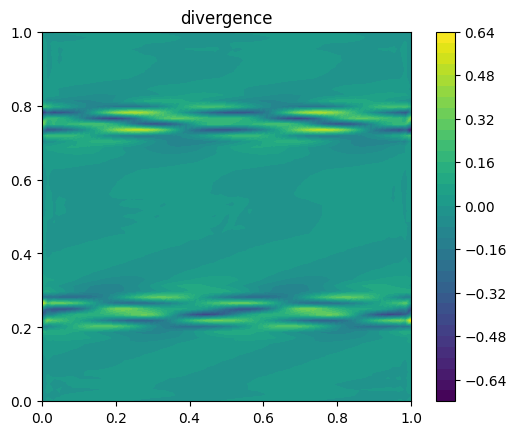

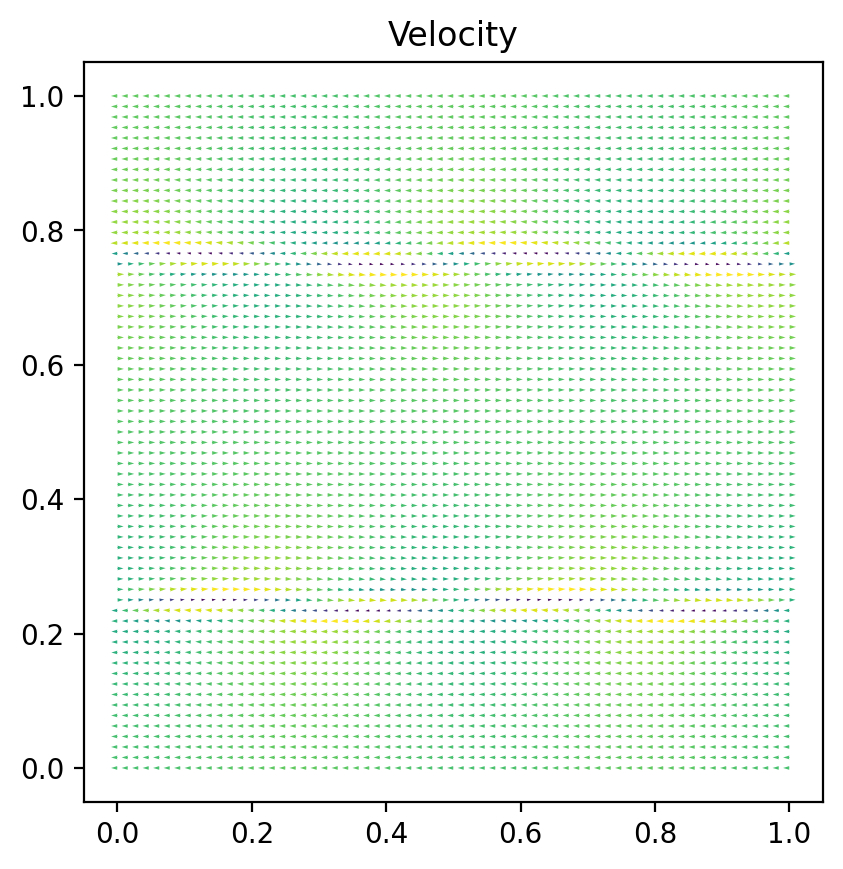

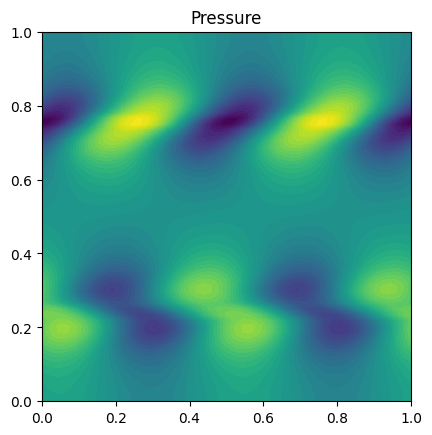

Time t = 0.20992232566475638


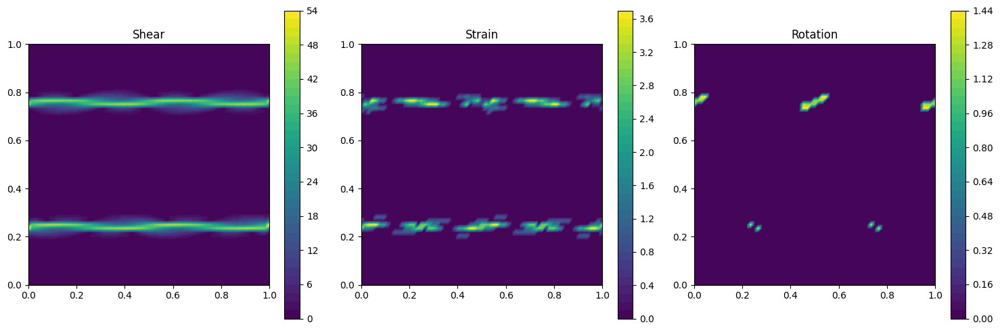

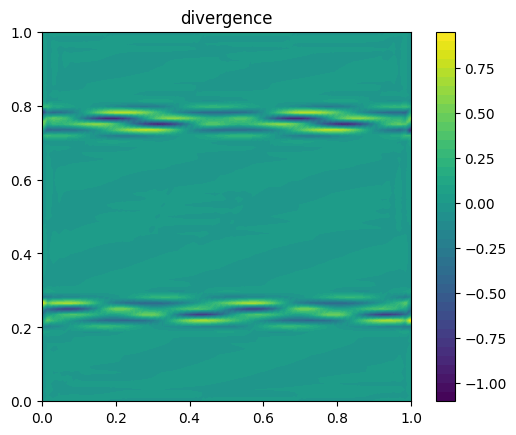

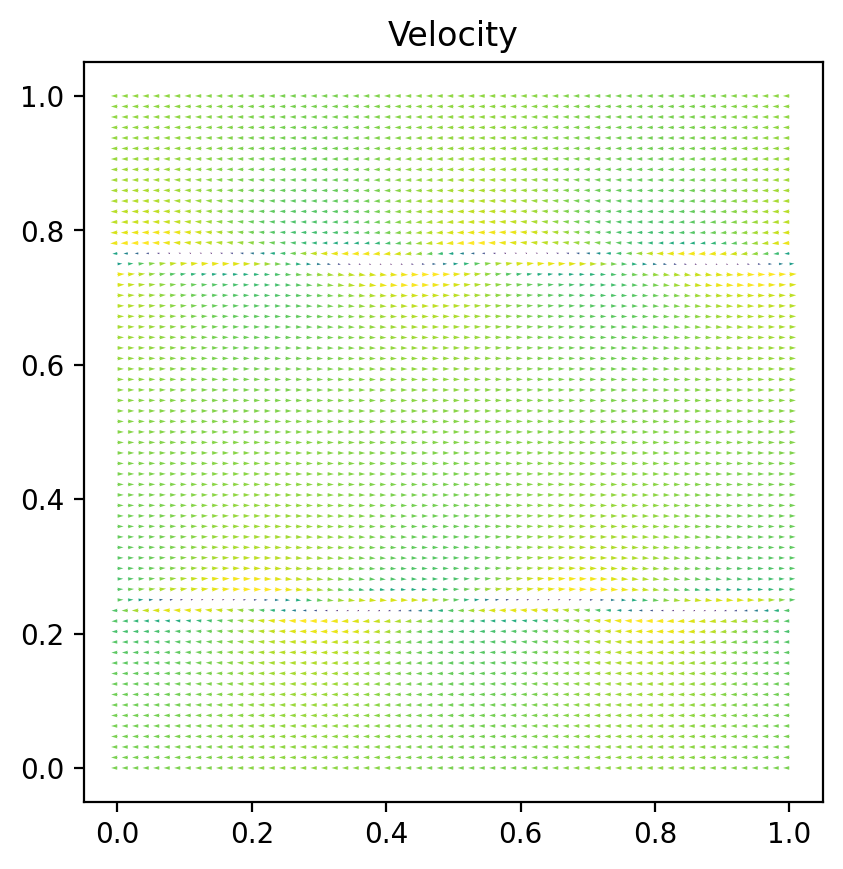

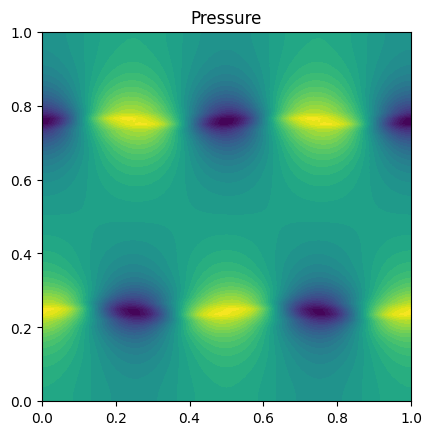

Time t = 0.30935921676911454


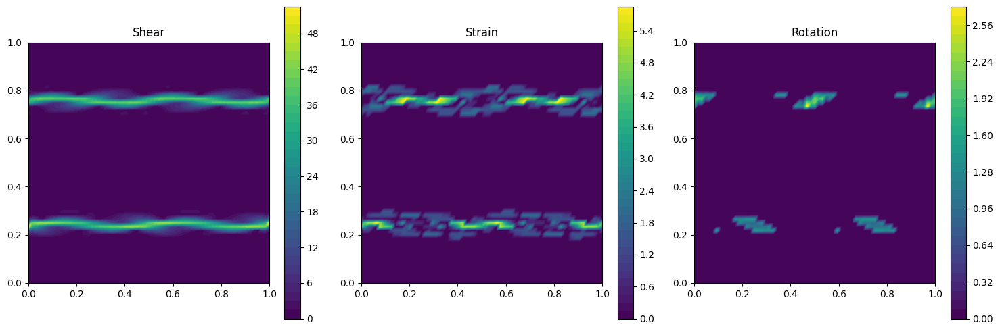

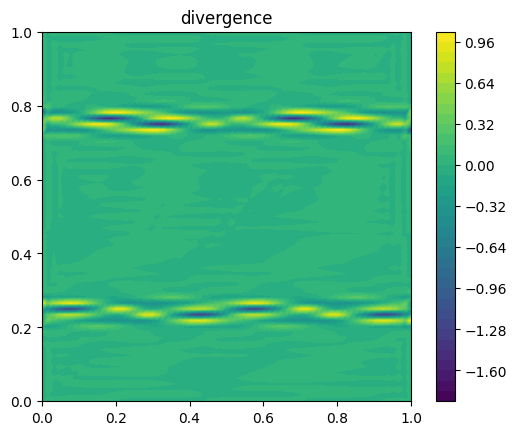

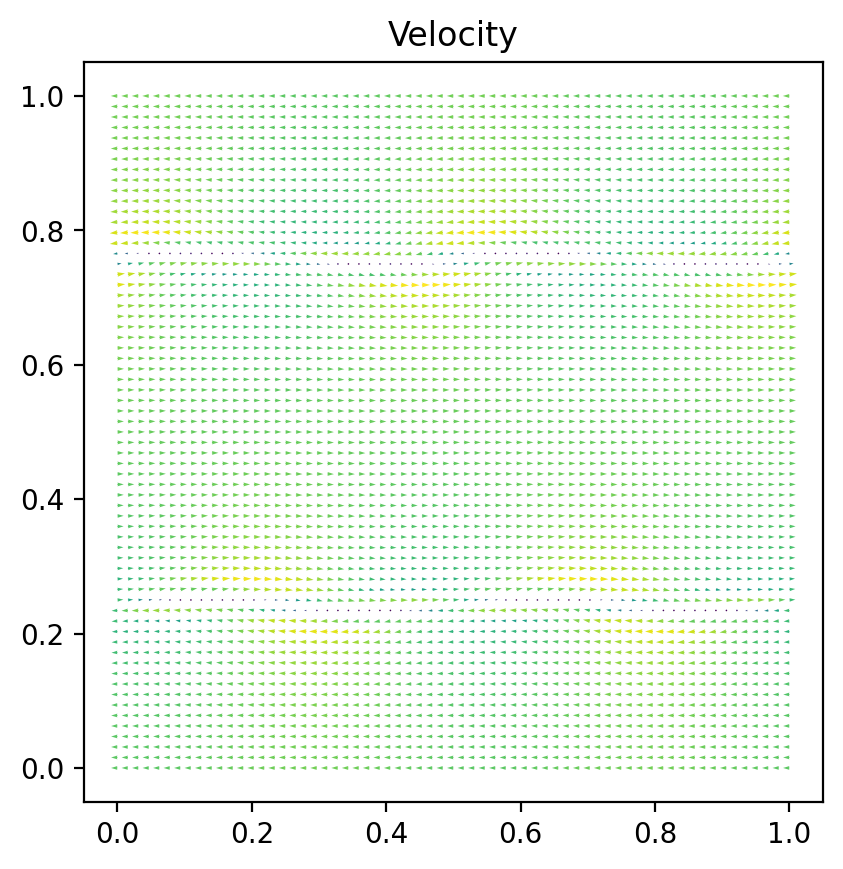

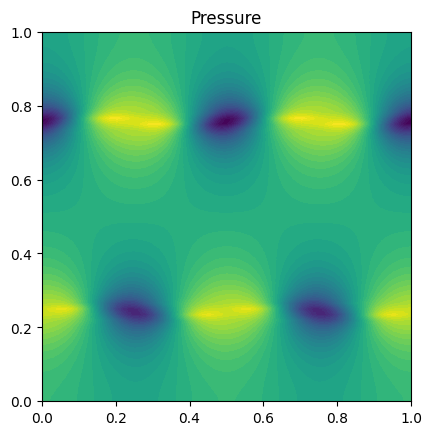

Time t = 0.4087961078734726


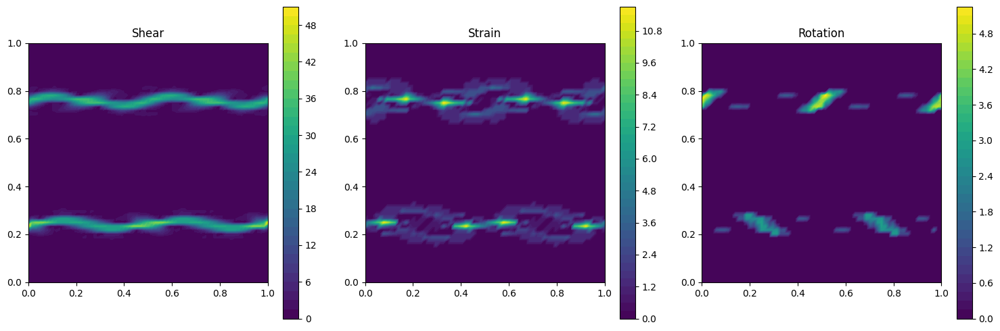

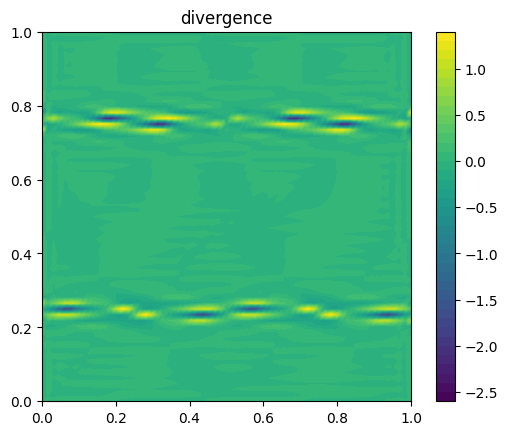

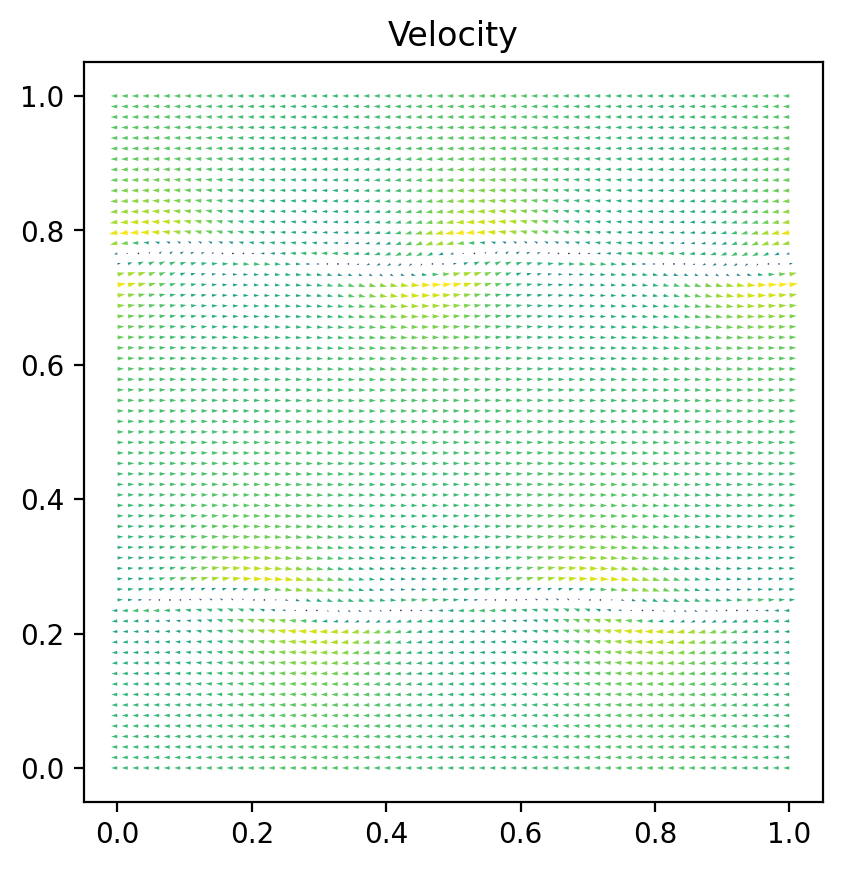

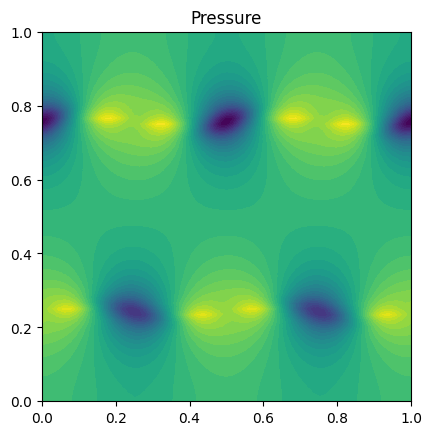

Time t = 0.5082329989778307


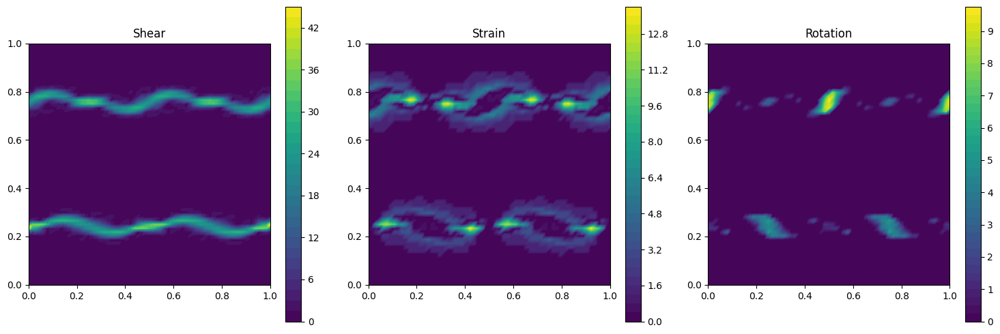

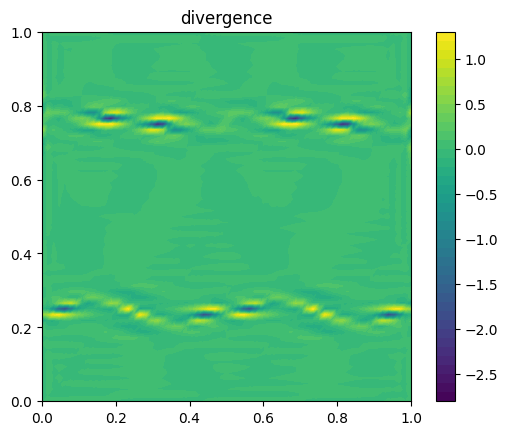

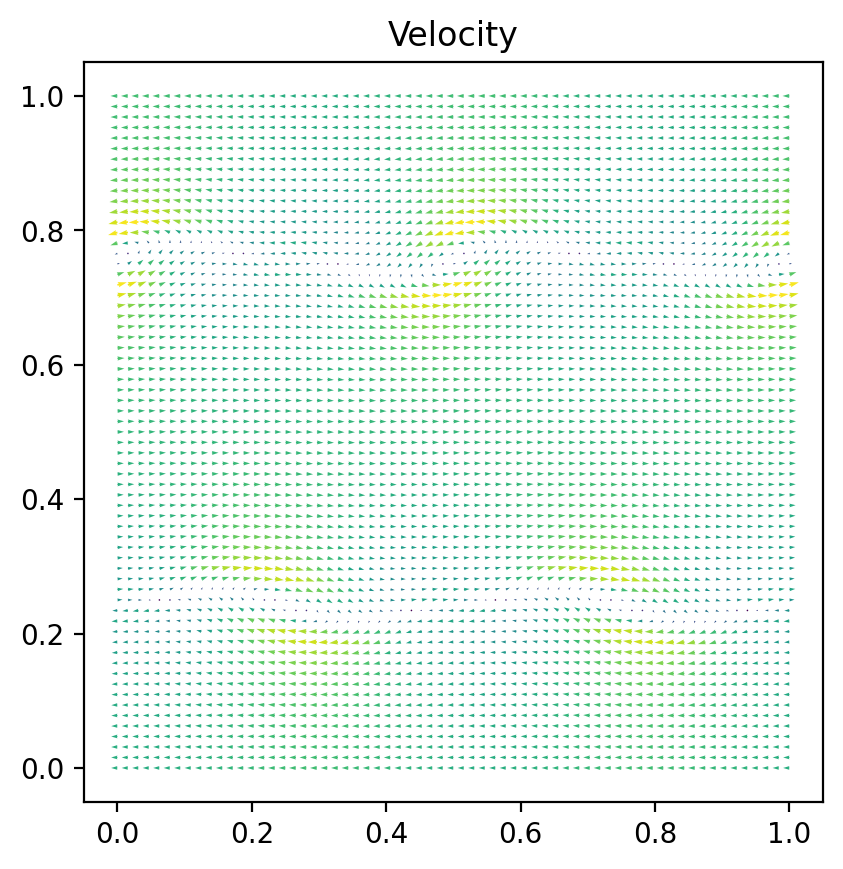

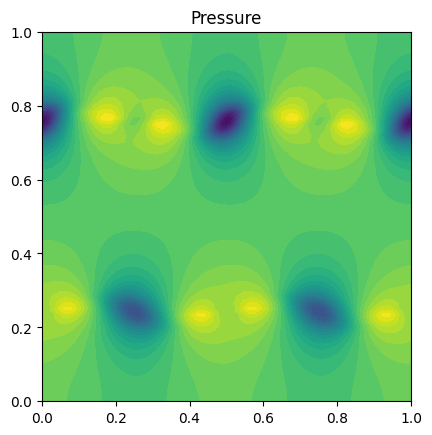

Time t = 0.6076698900821887


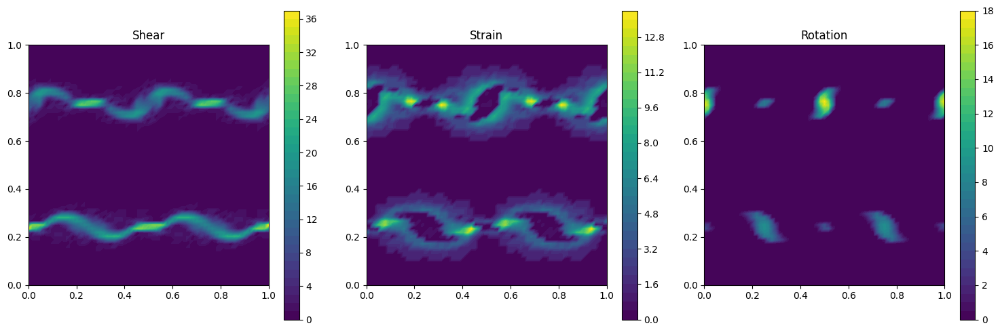

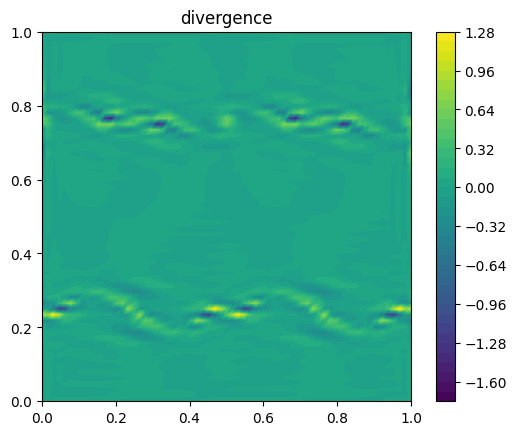

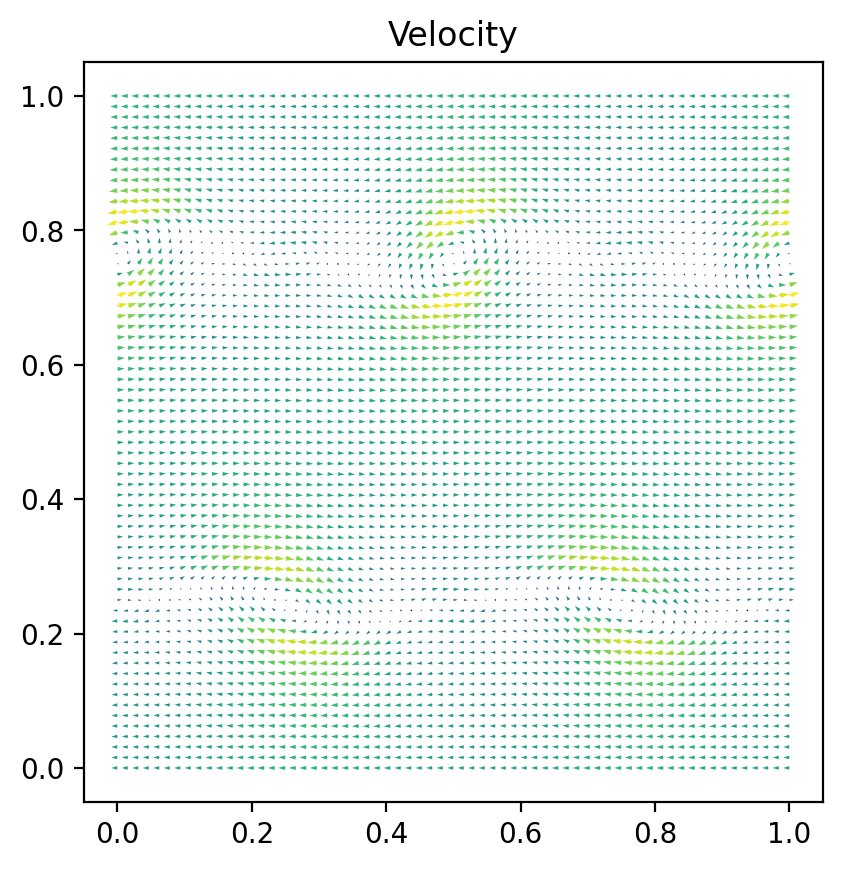

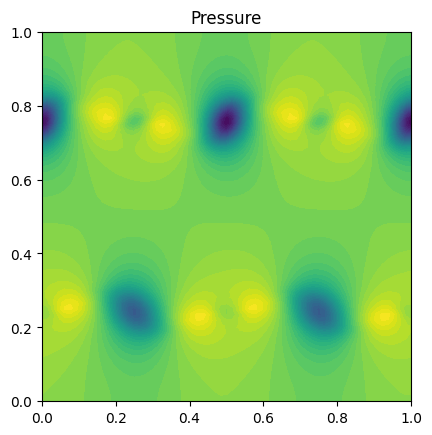

Time t = 0.7071067811865468


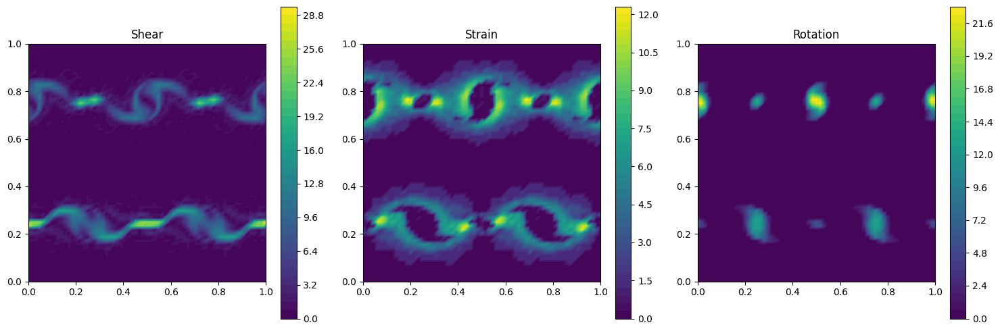

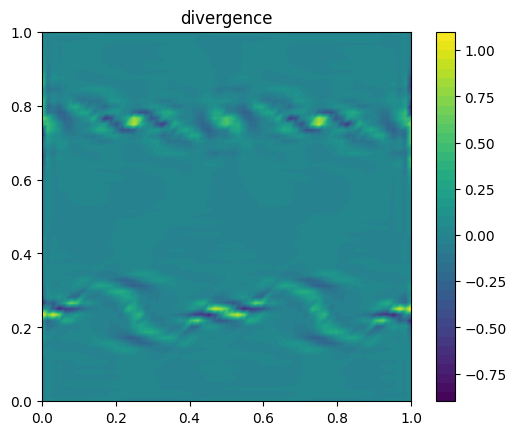

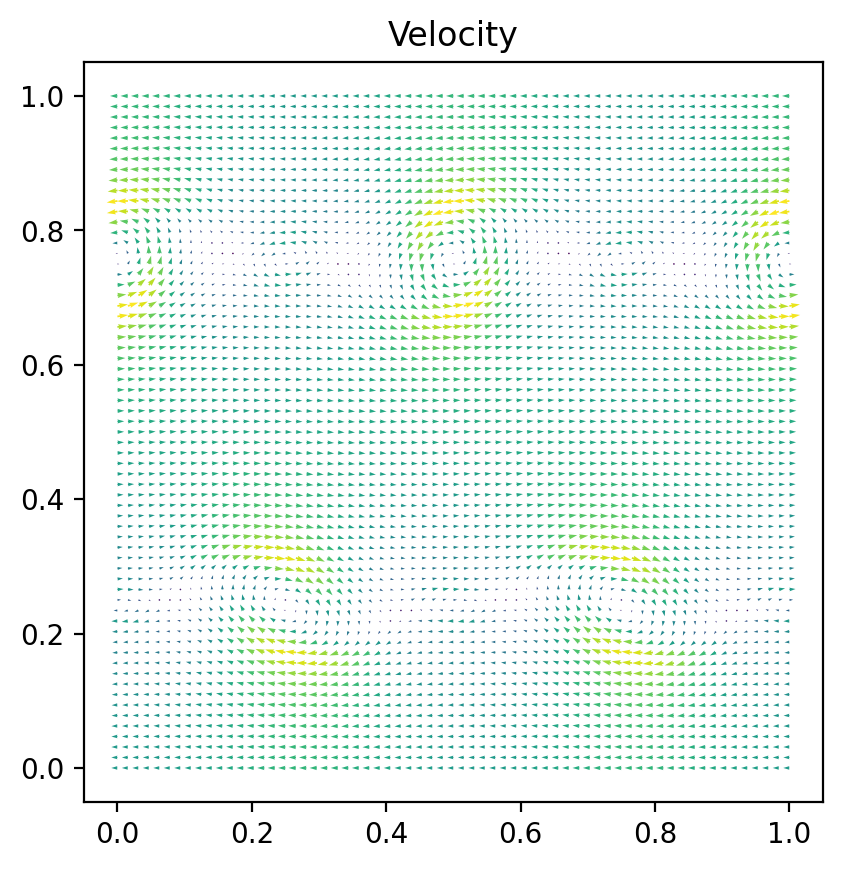

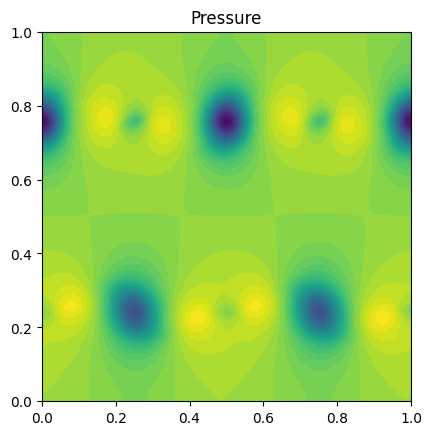

Time t = 0.8065436722909048


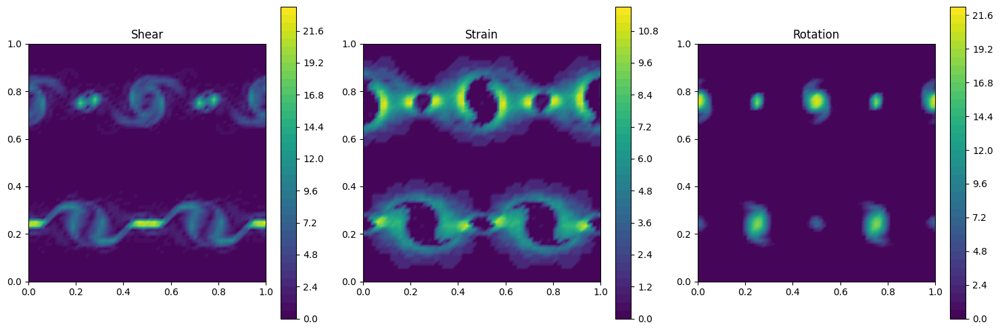

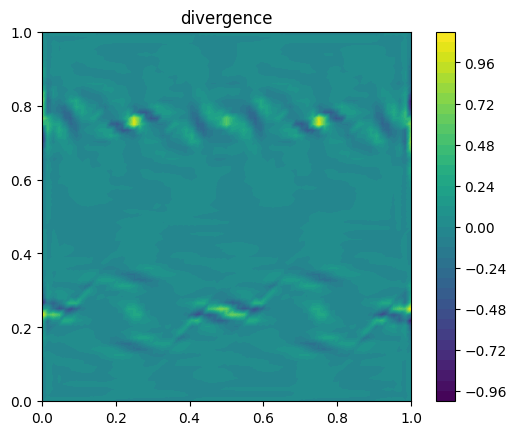

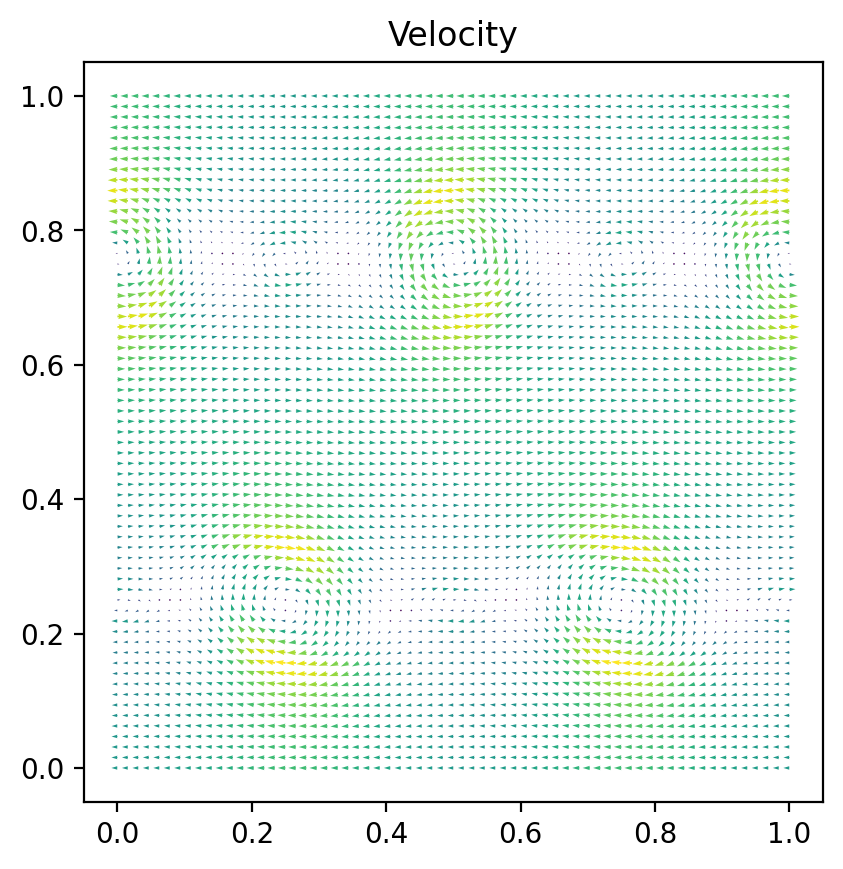

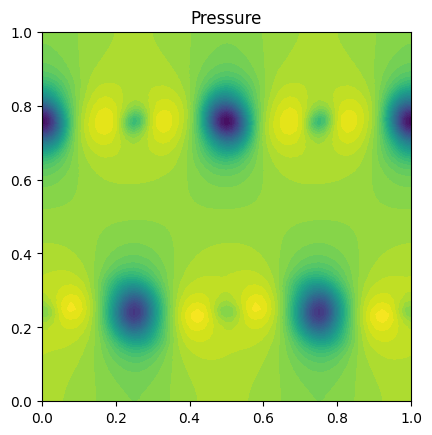

Time t = 0.9059805633952629


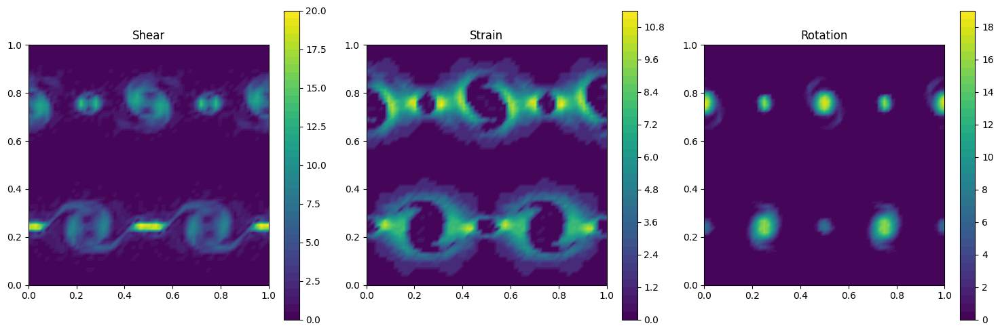

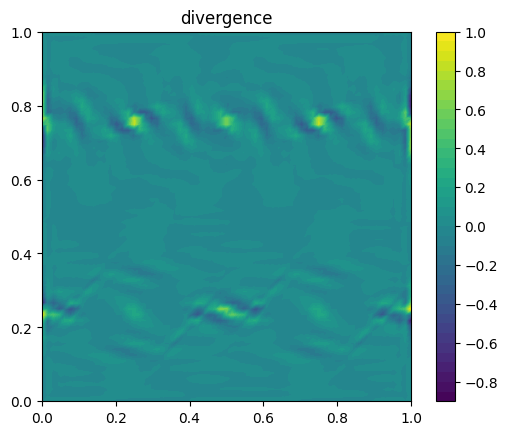

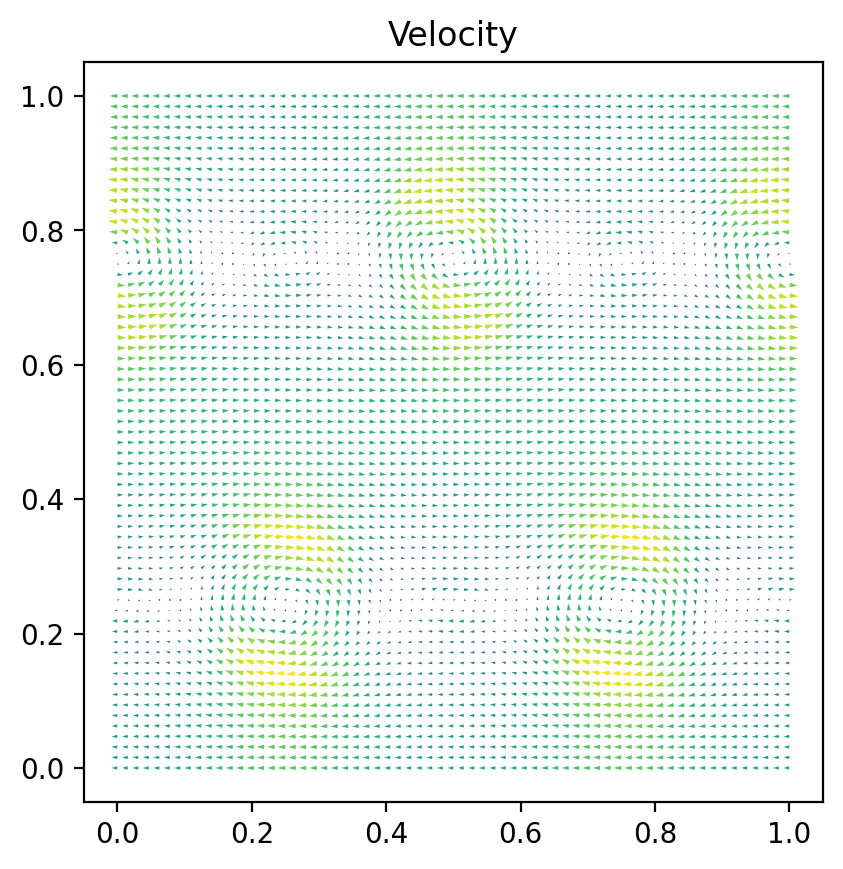

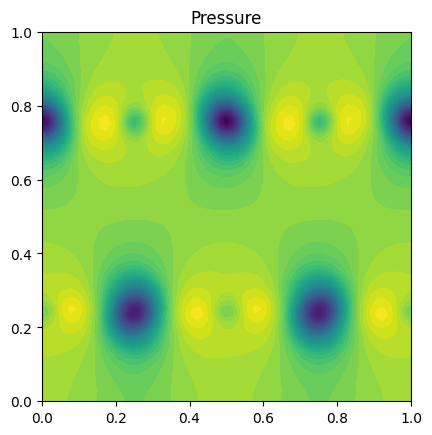

Time t = 1.005417454499621


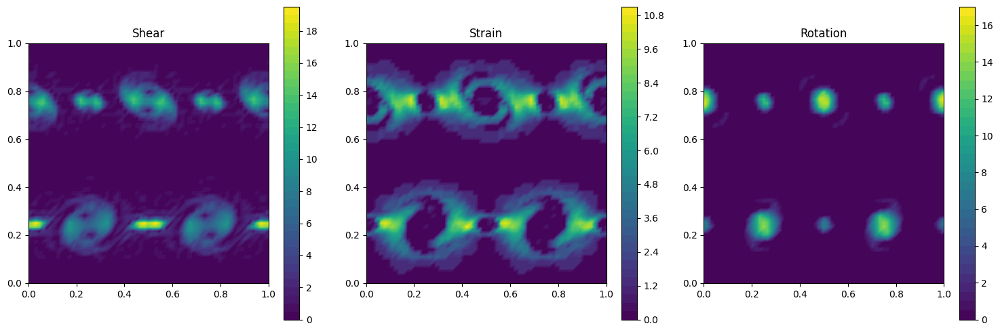

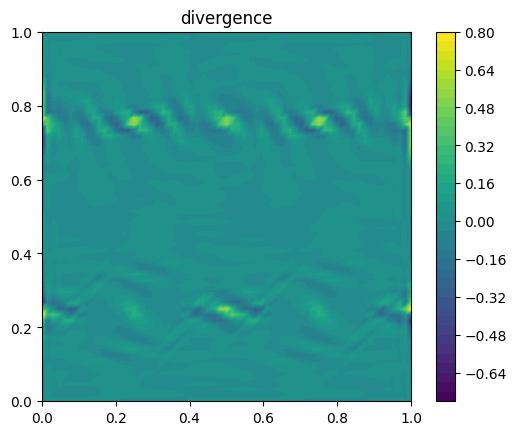

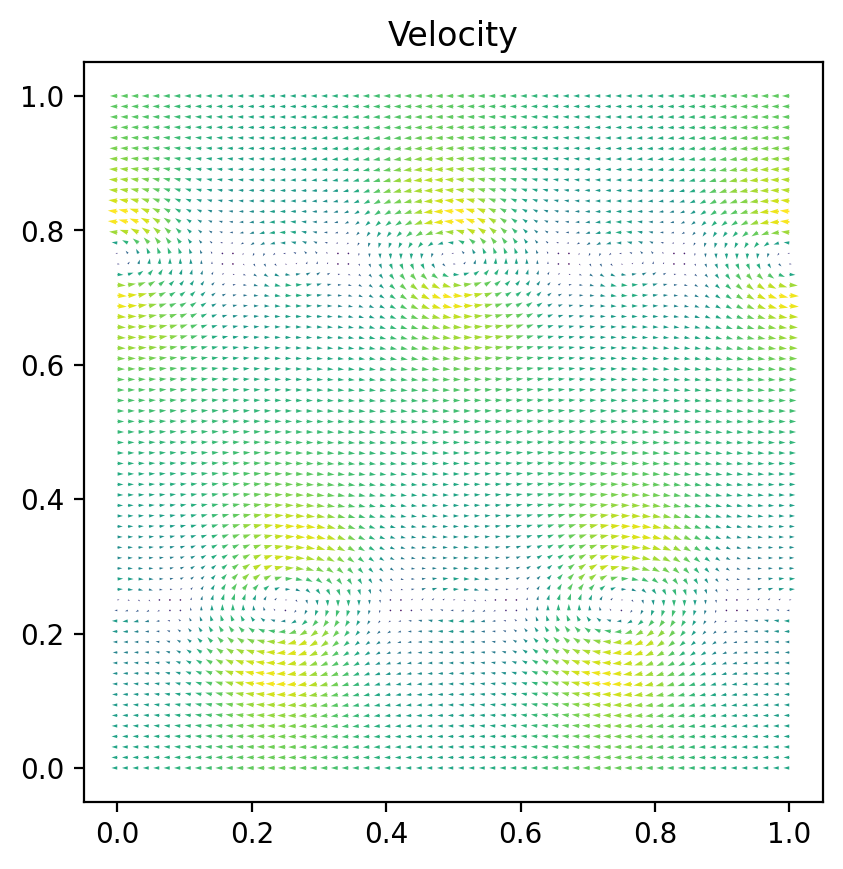

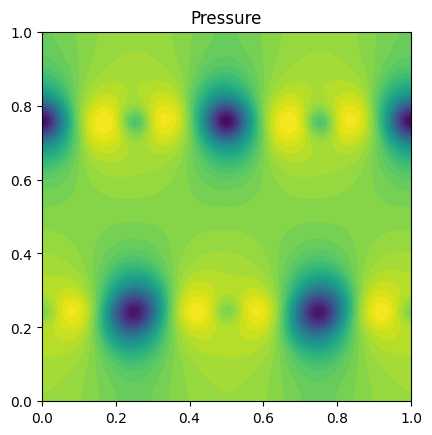

Time t = 1.10485434560398


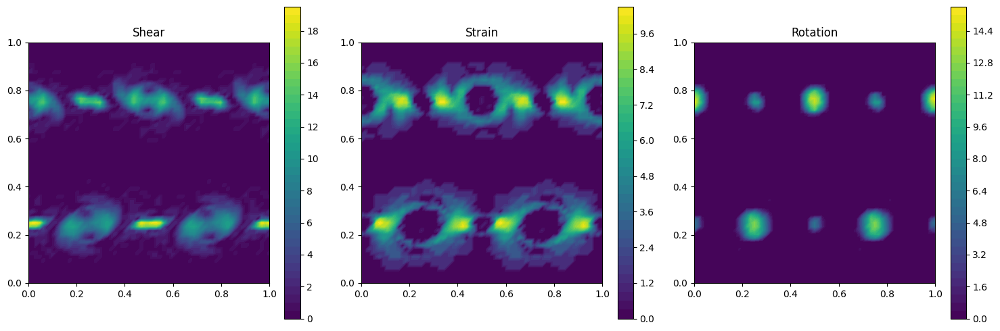

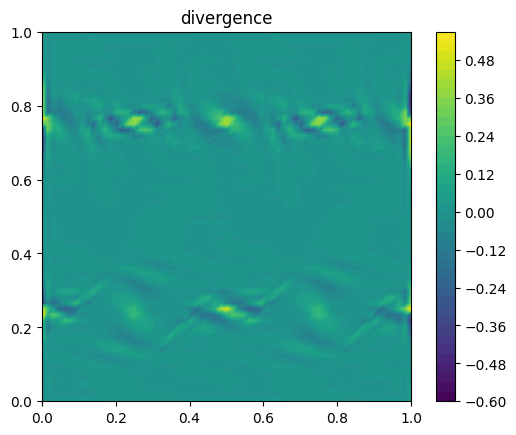

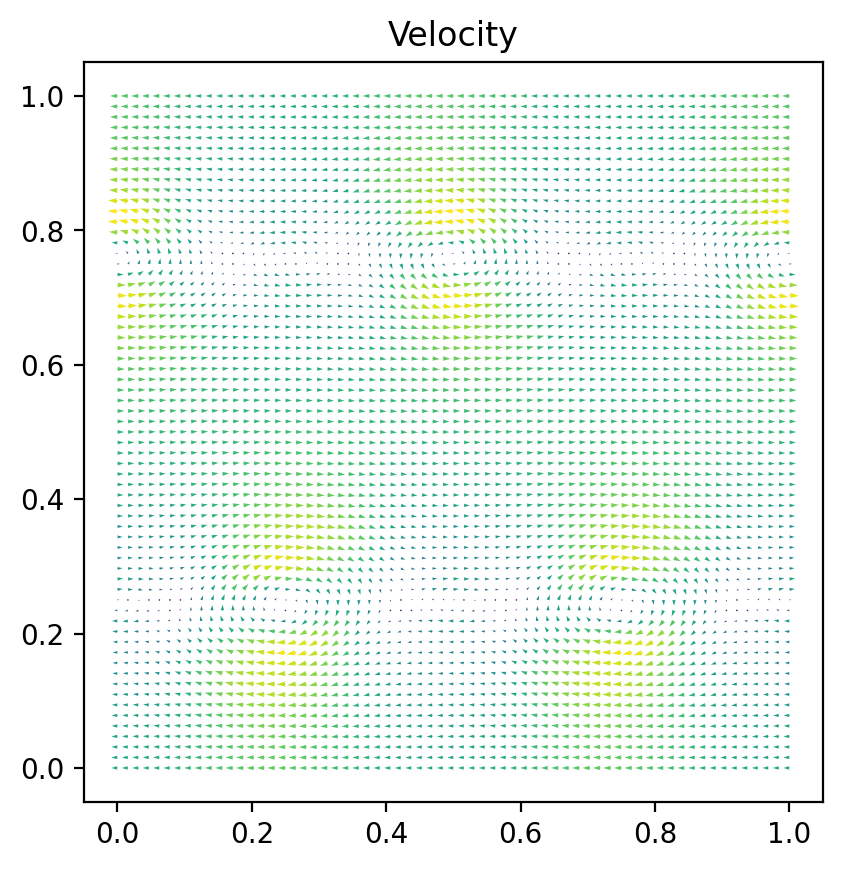

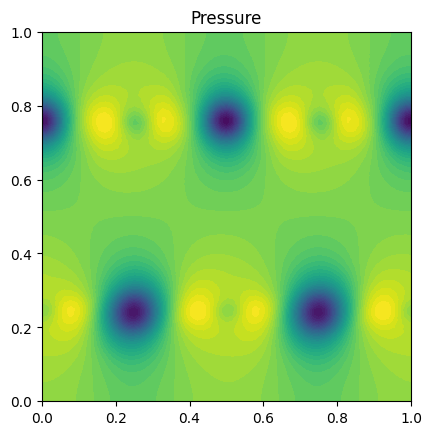

Time t = 1.2042912367083392


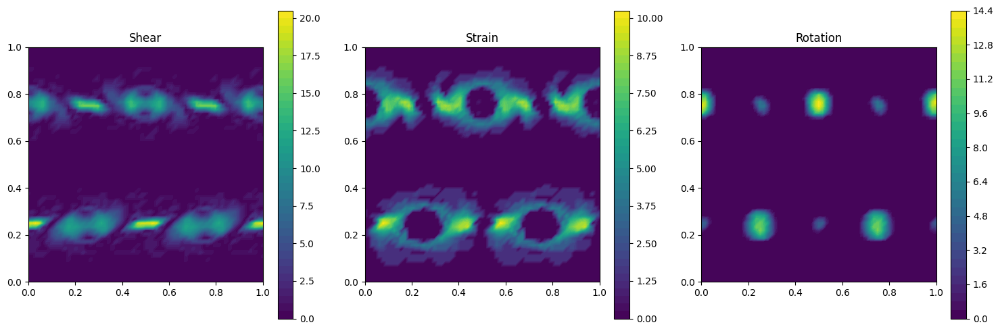

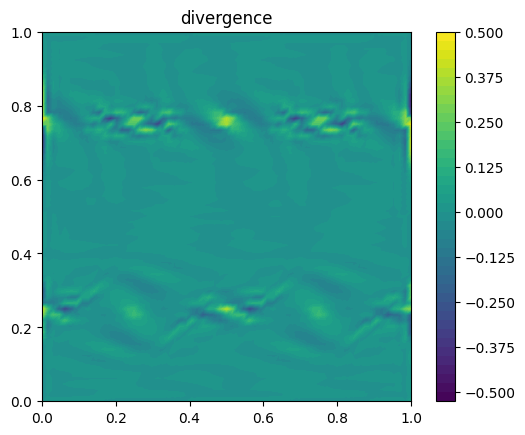

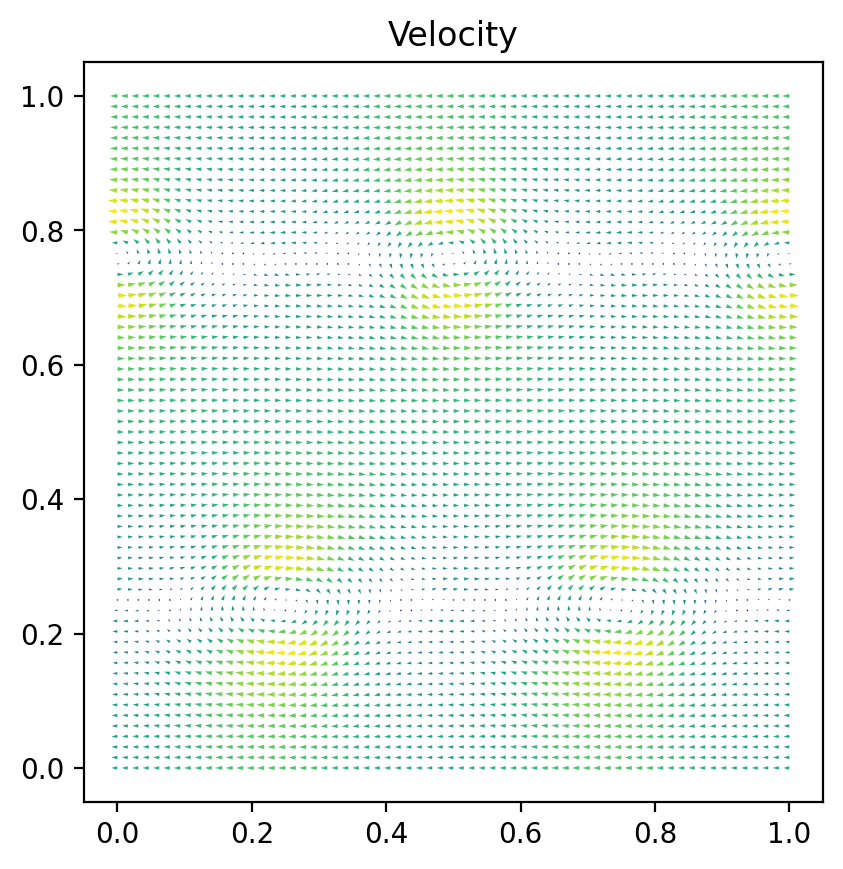

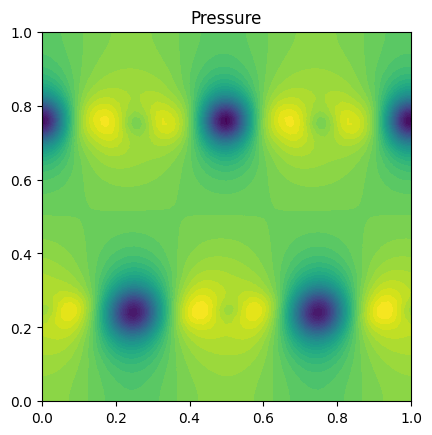

Time t = 1.3037281278126982


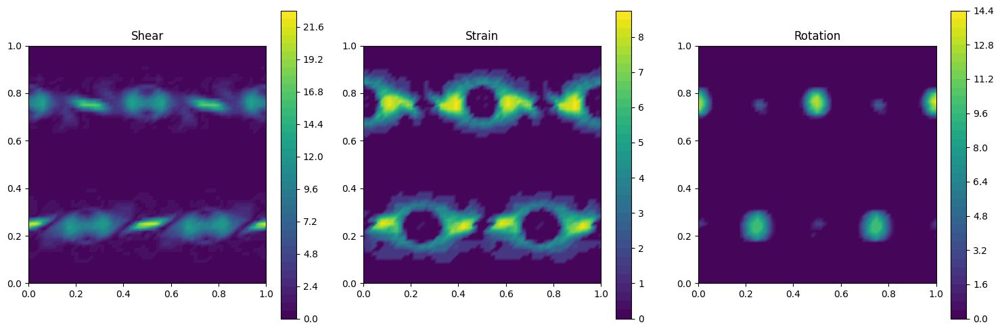

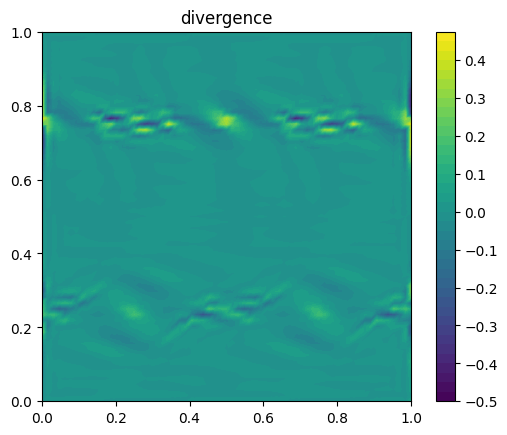

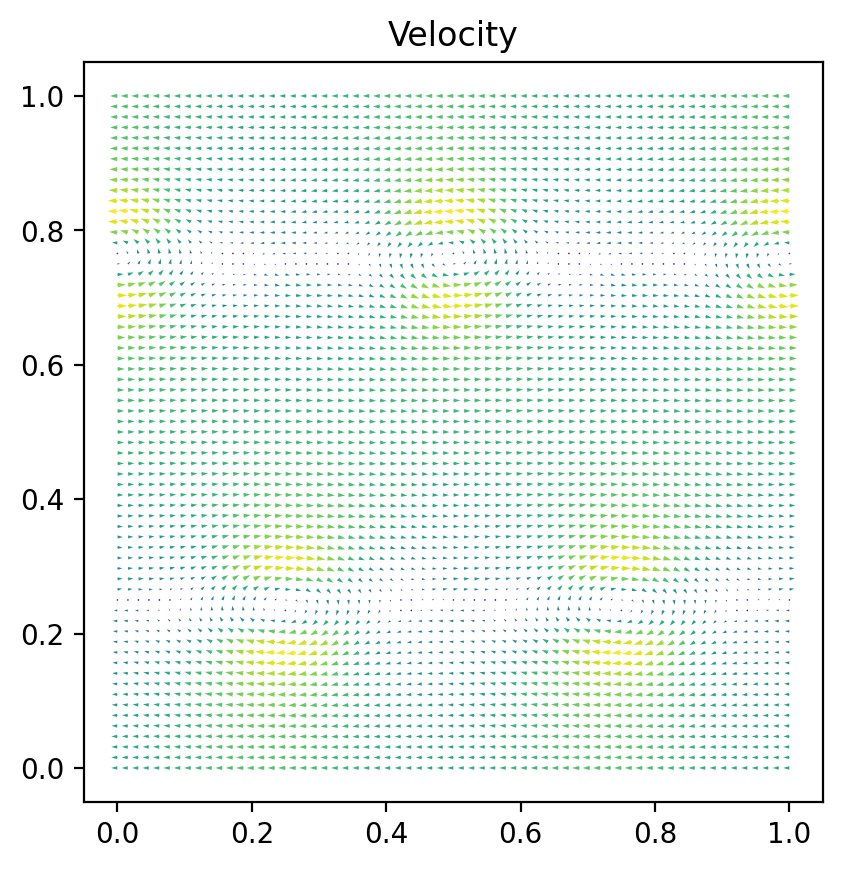

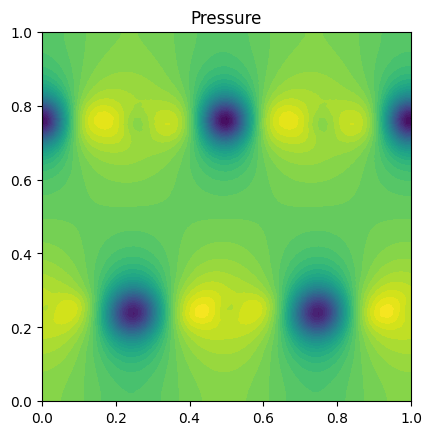

Time t = 1.4031650189170572


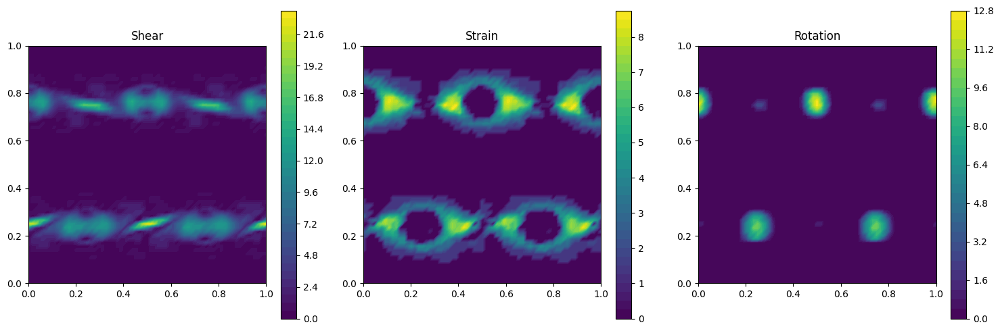

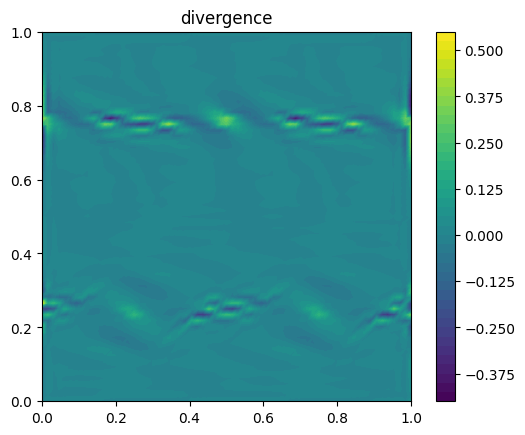

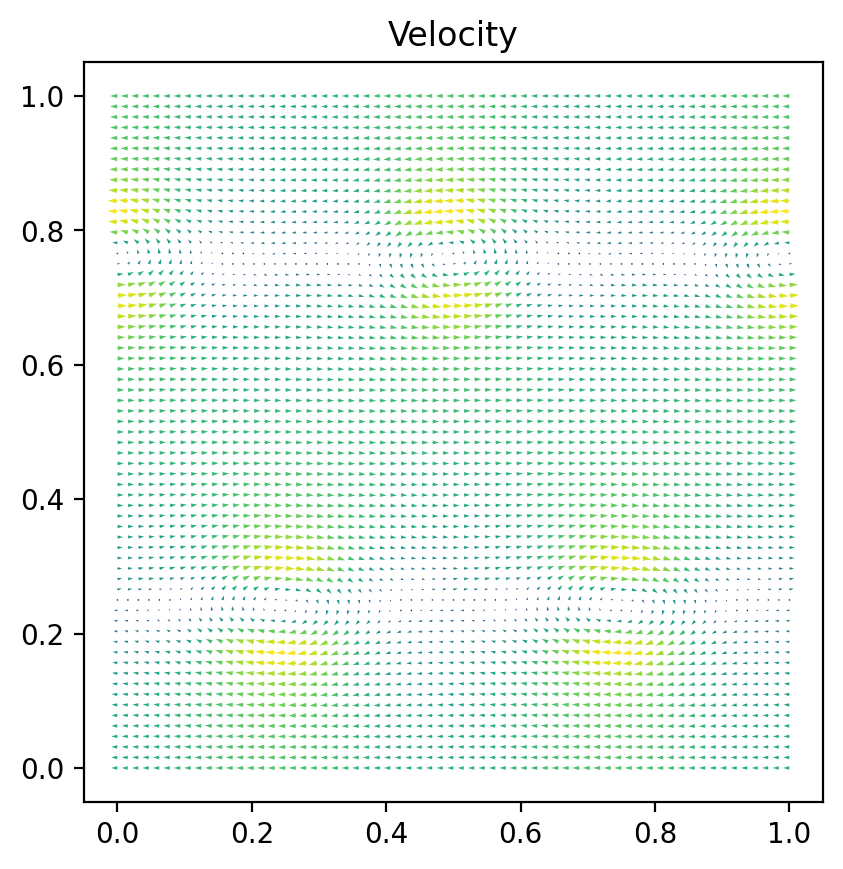

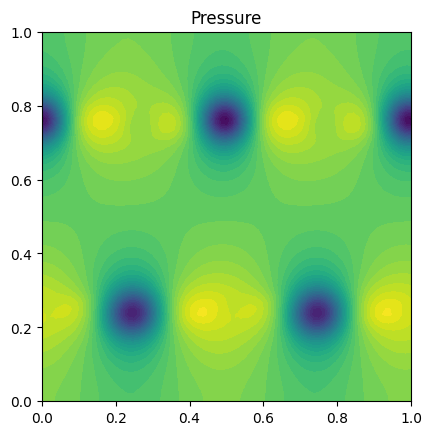

Time t = 1.5026019100214163


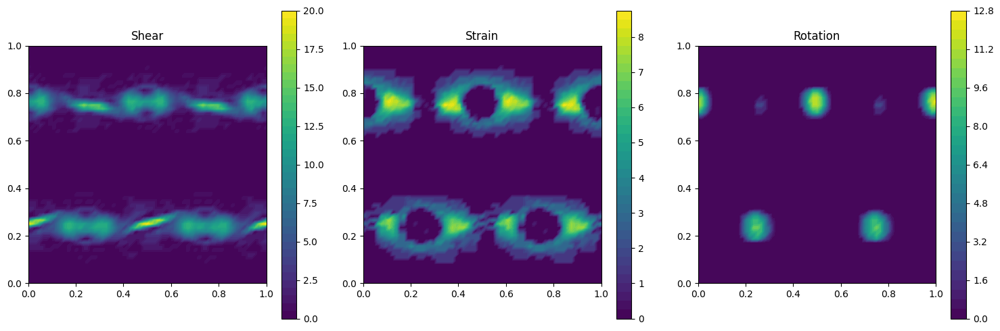

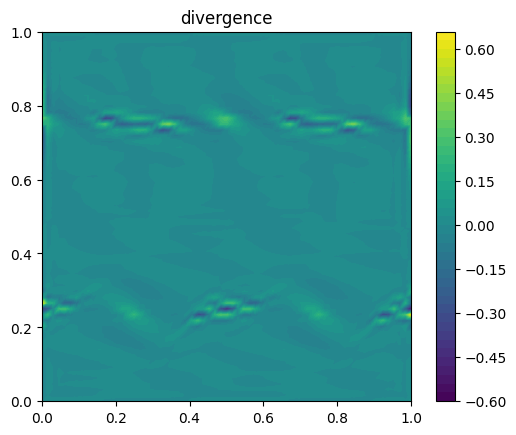

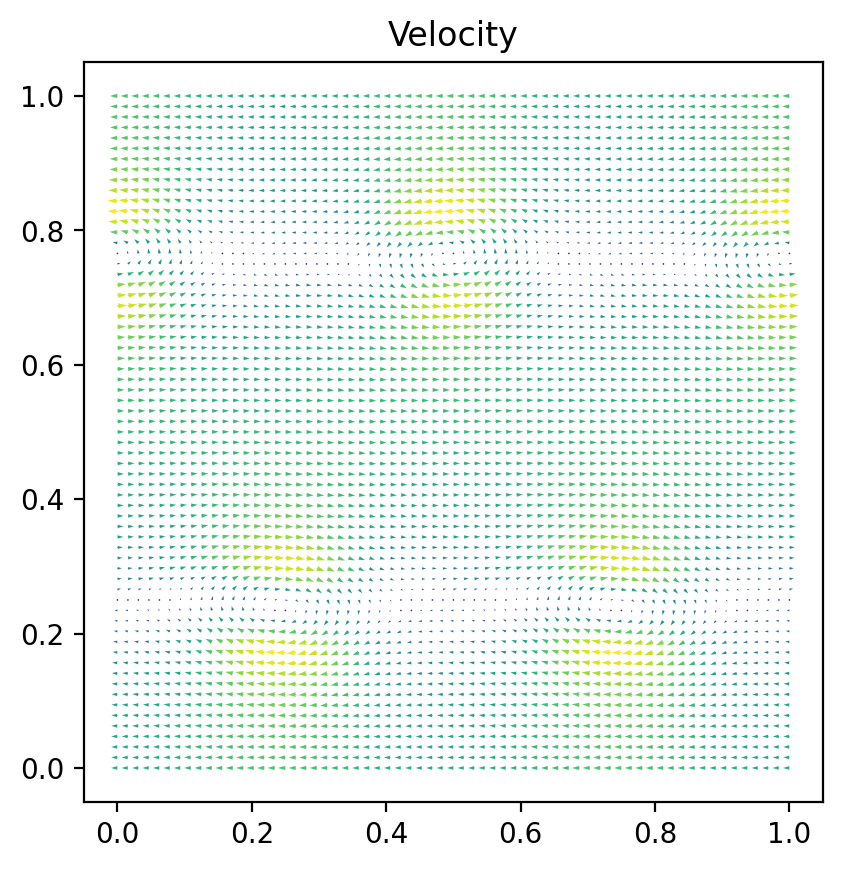

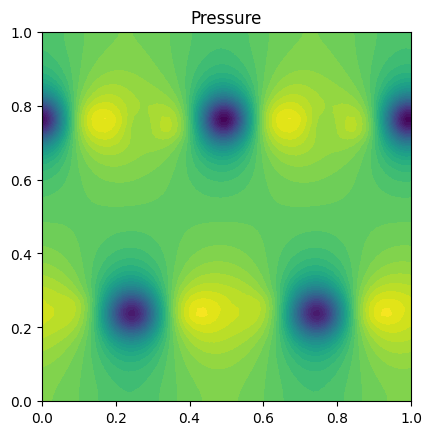

Time t = 1.6020388011257753


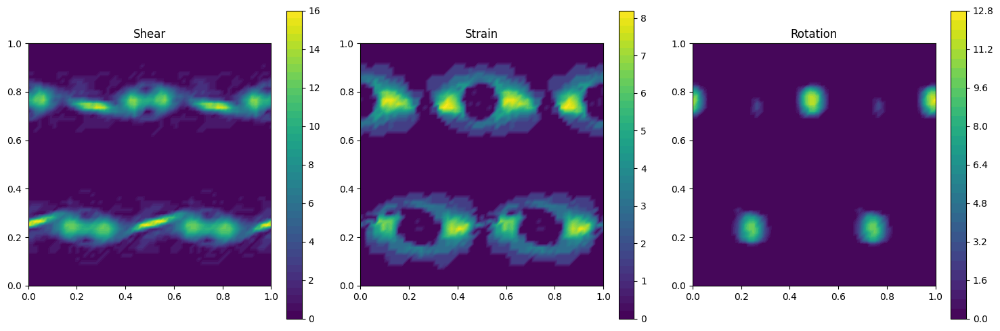

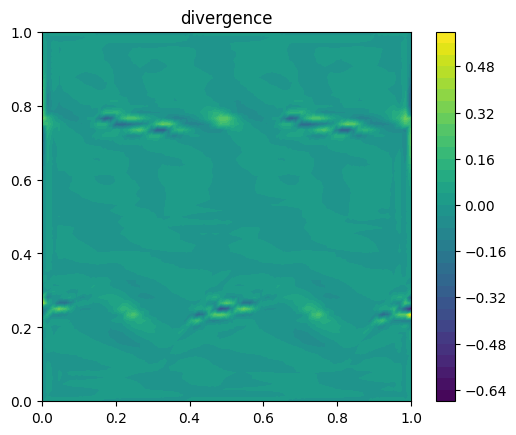

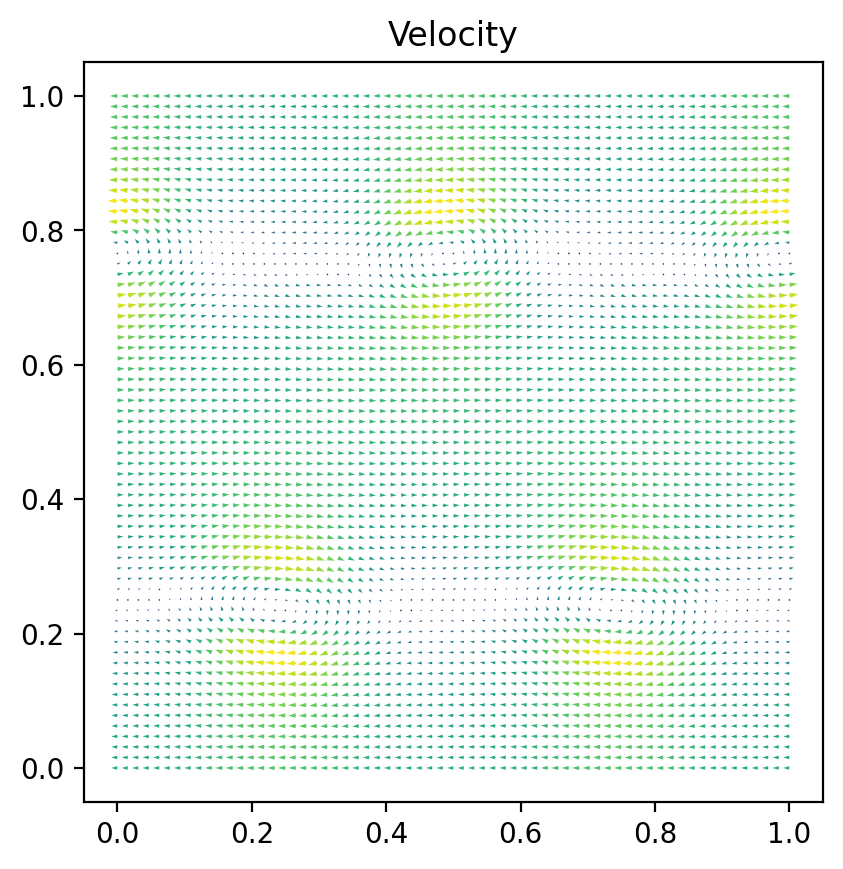

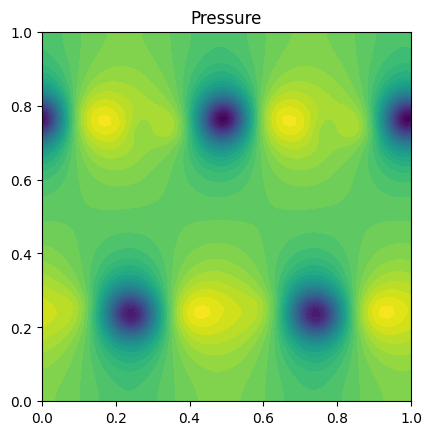

Time t = 1.7014756922301344


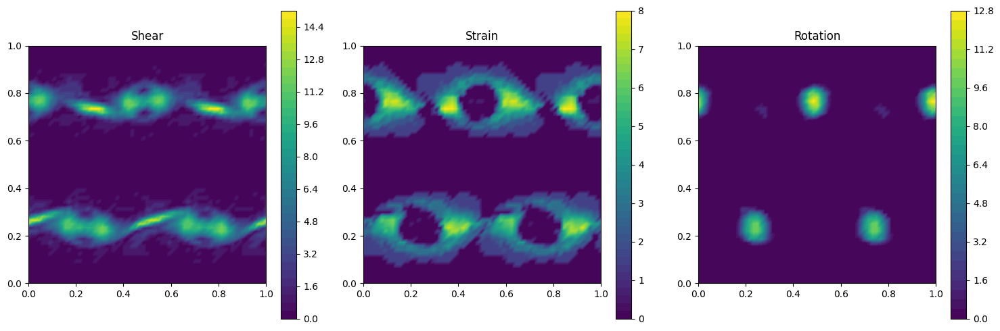

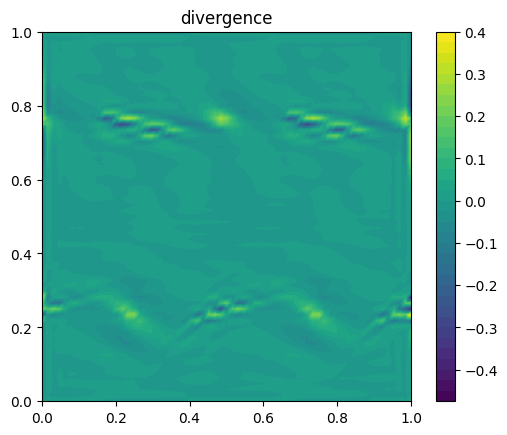

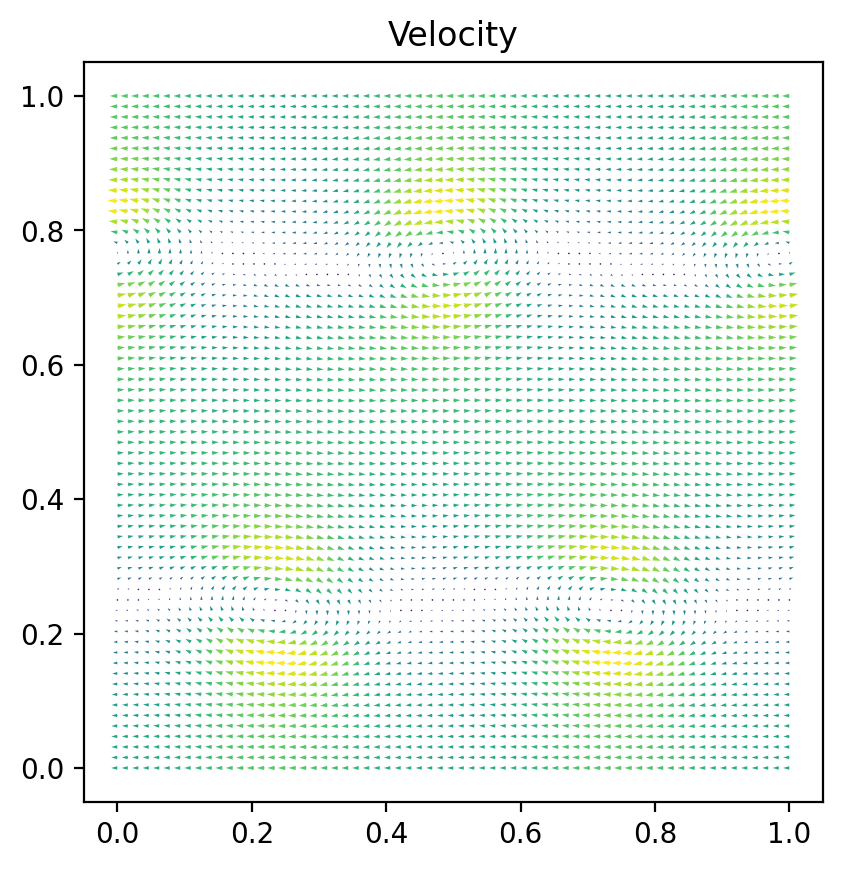

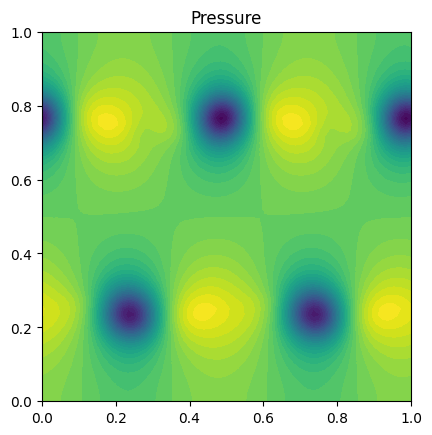

Time t = 1.8009125833344934


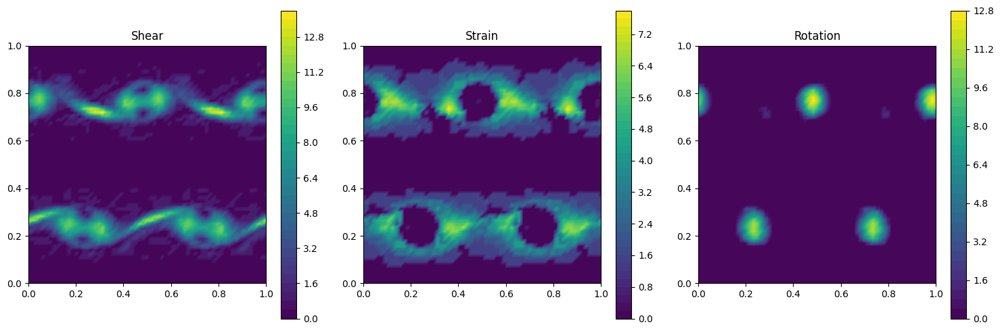

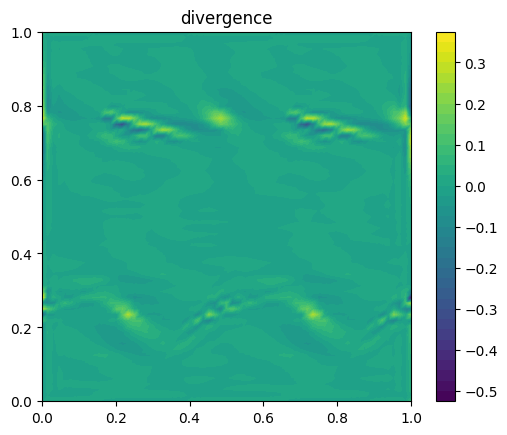

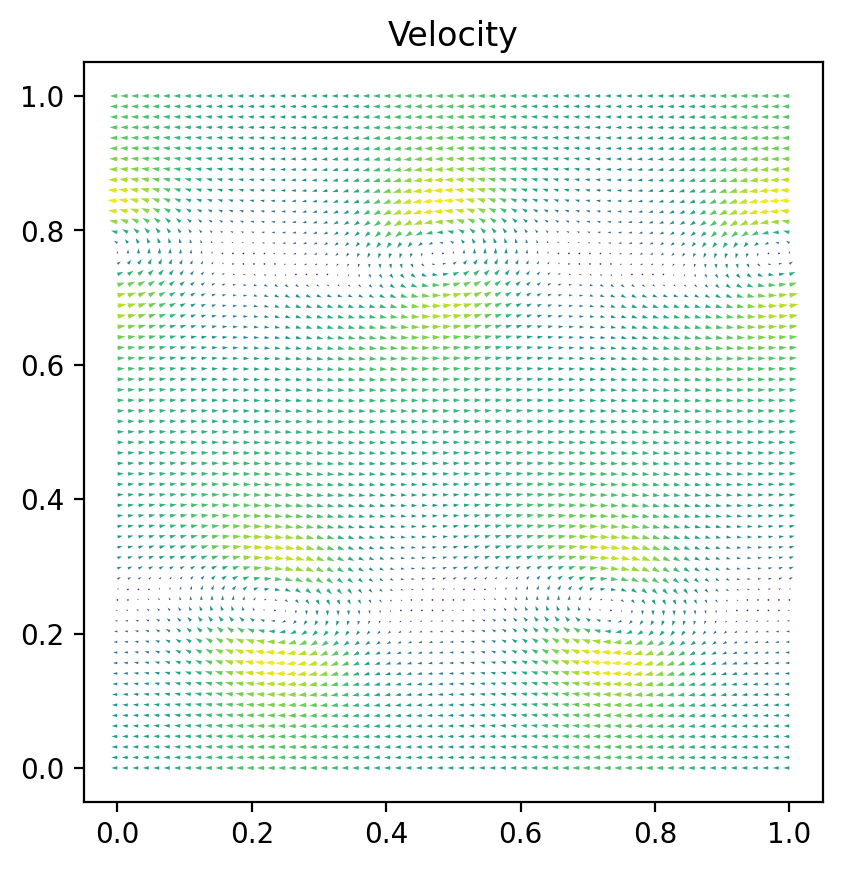

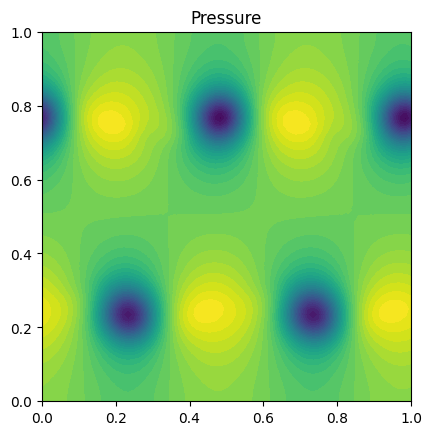

Time t = 1.9003494744388525


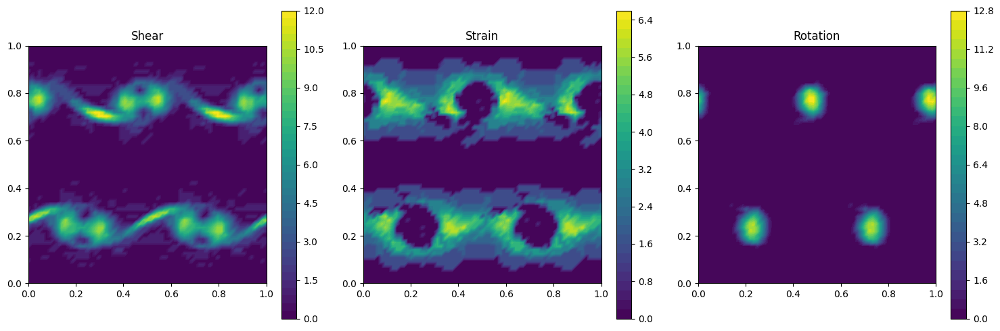

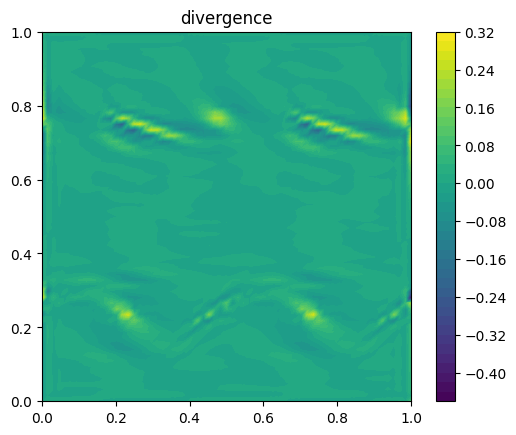

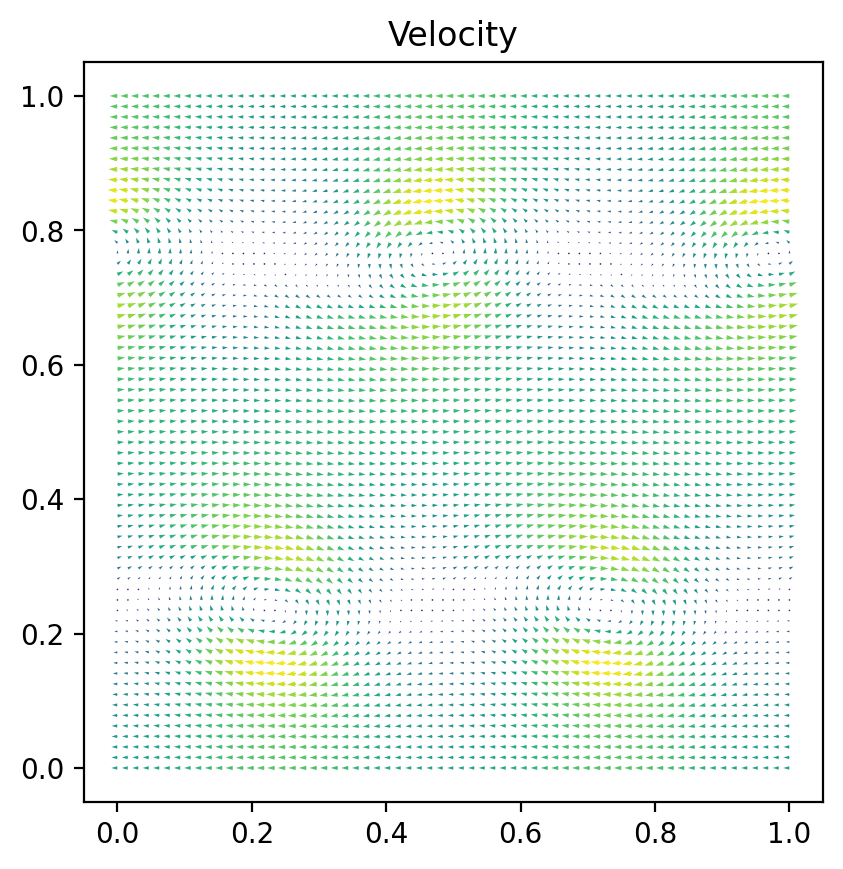

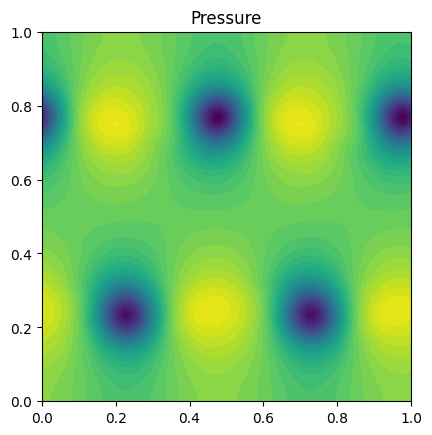

Time t = 2.0108349089992514


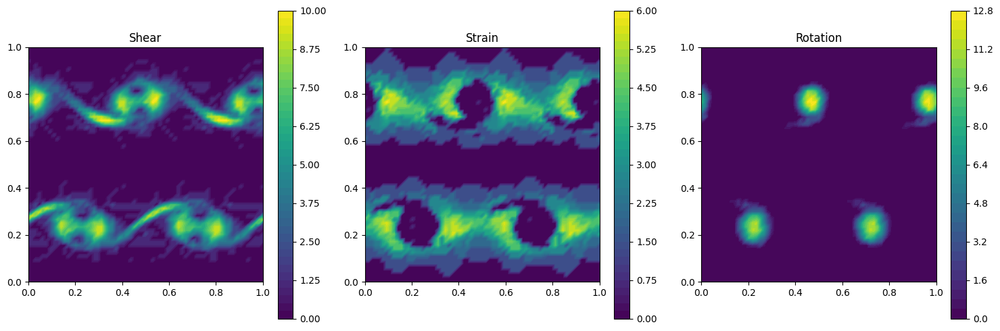

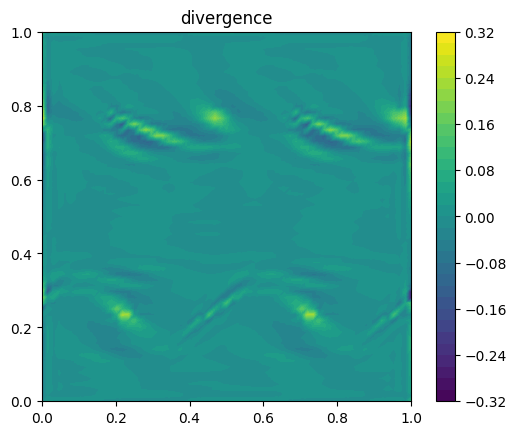

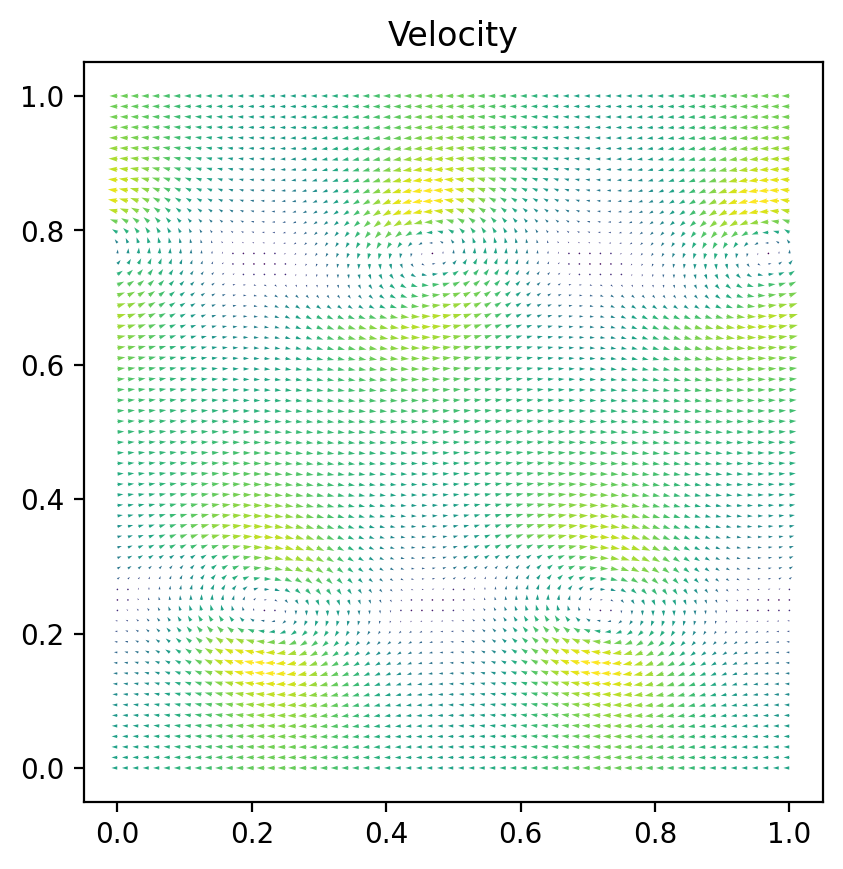

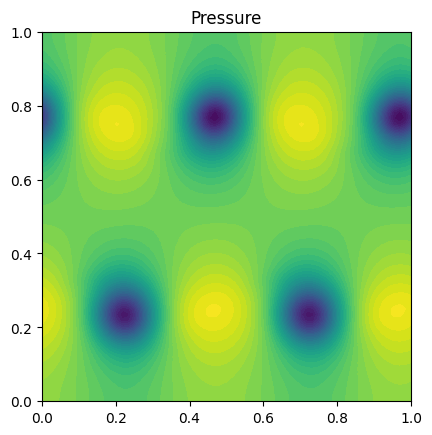

Time t = 2.1102718001036105


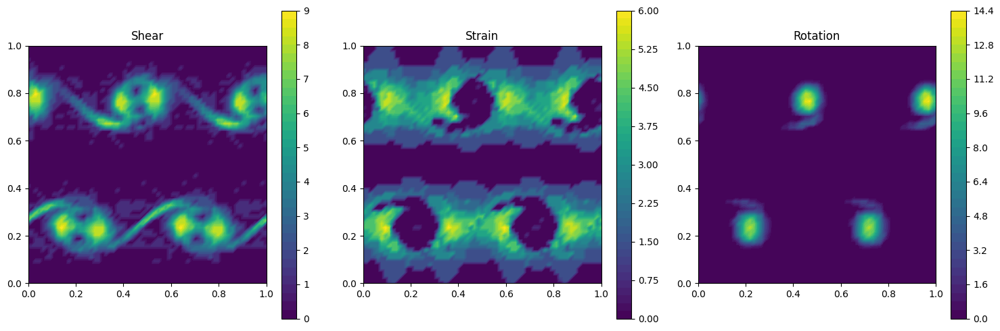

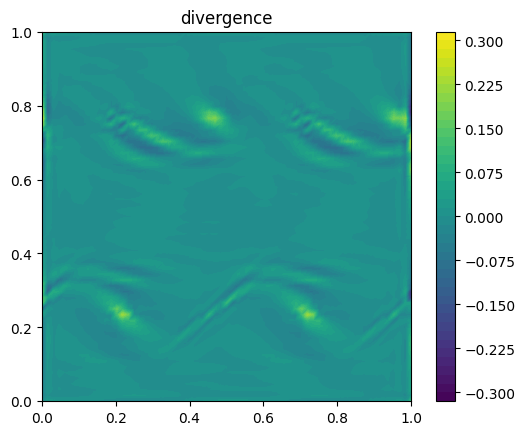

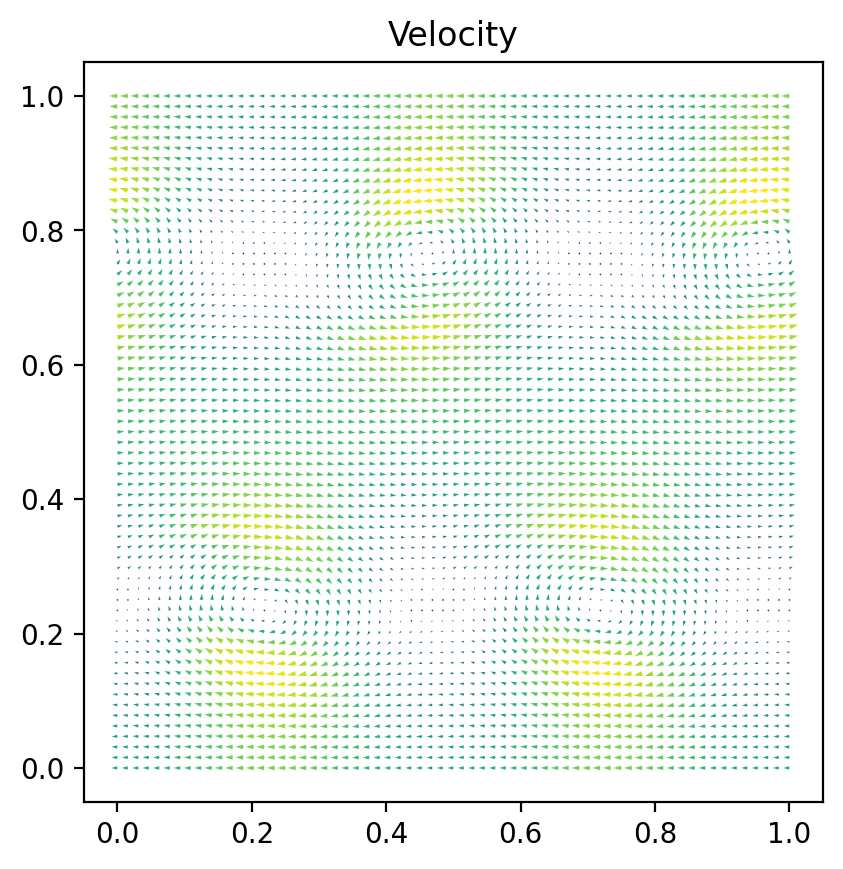

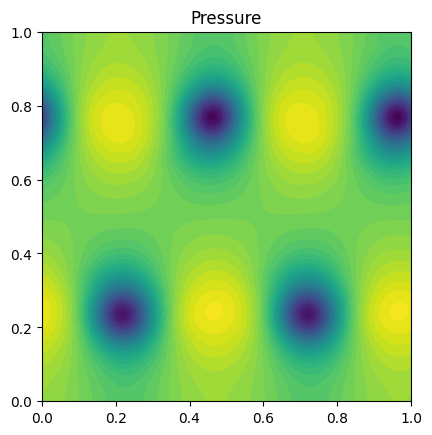

Time t = 2.2097086912079695


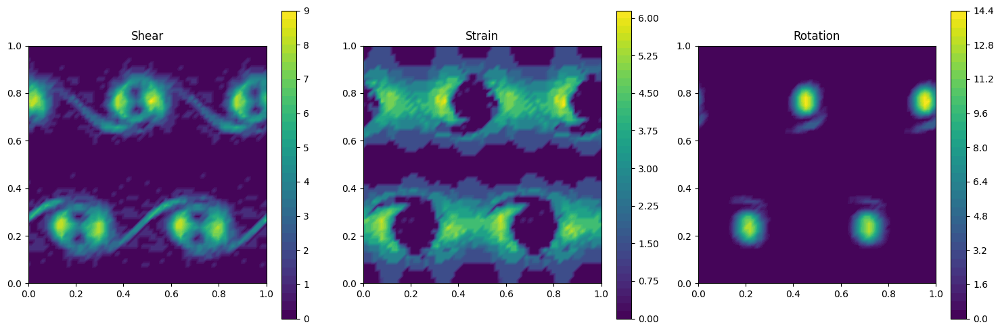

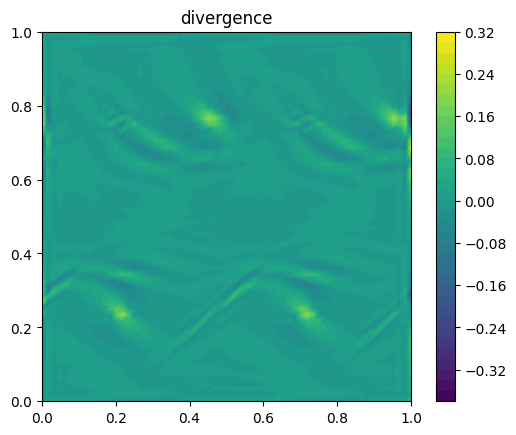

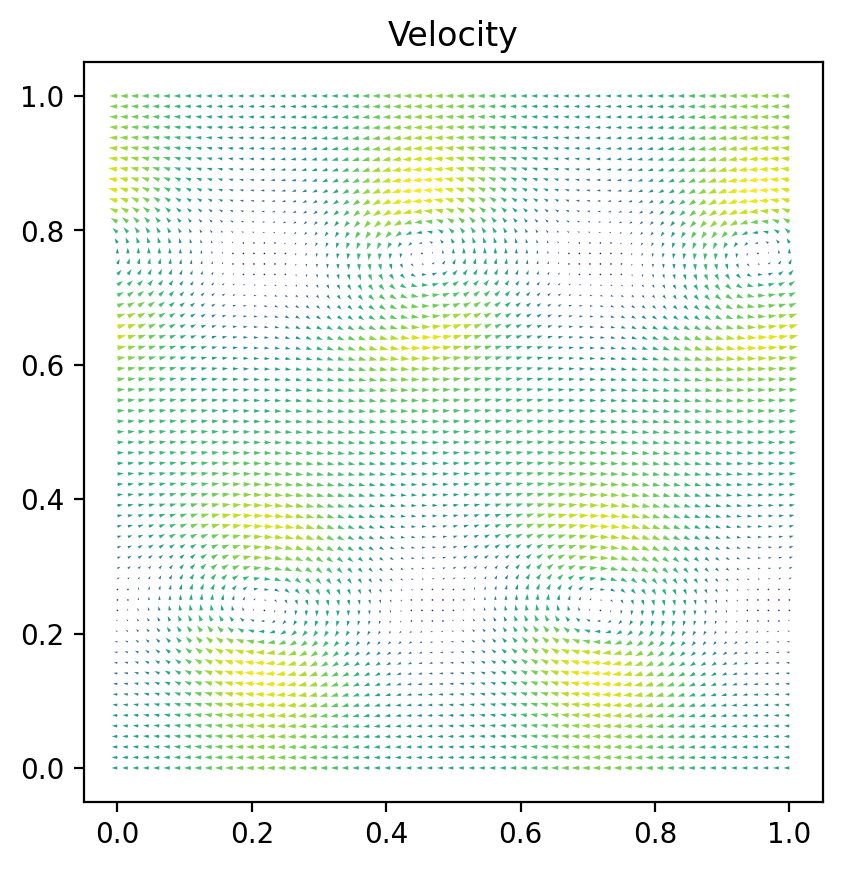

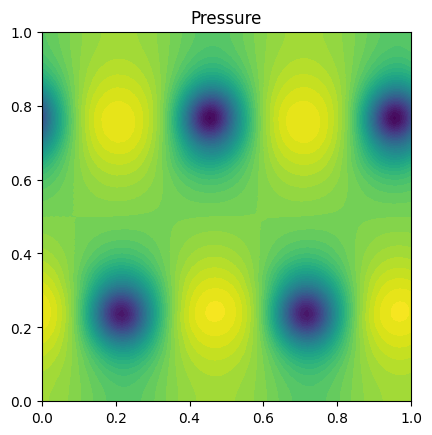

Time t = 2.3091455823123286


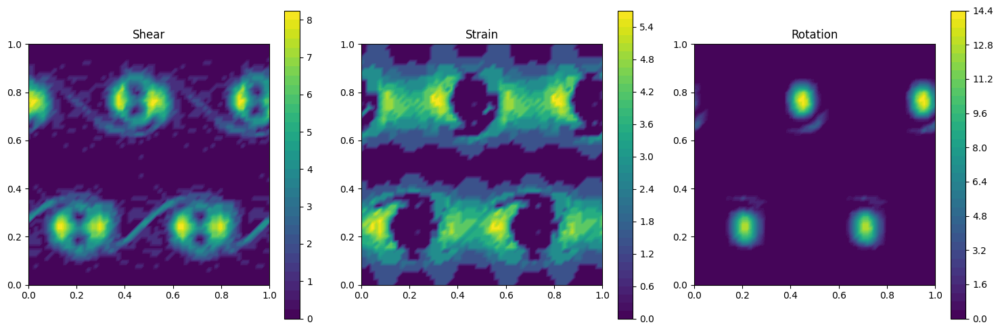

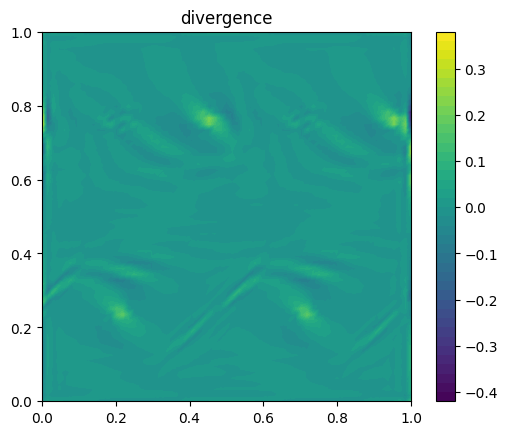

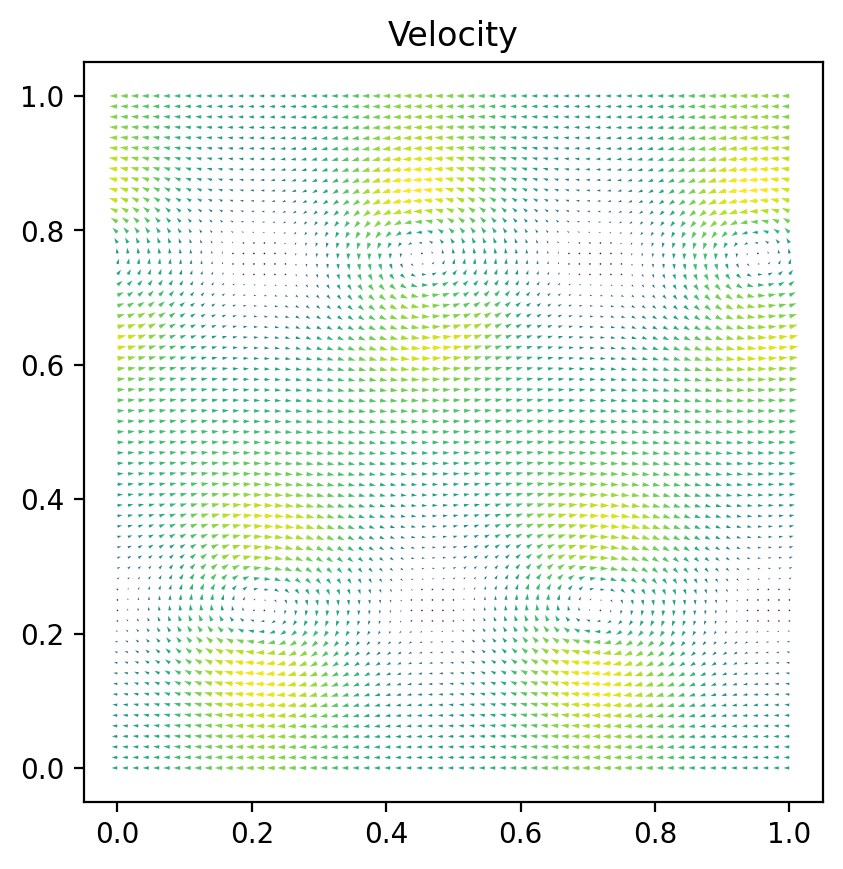

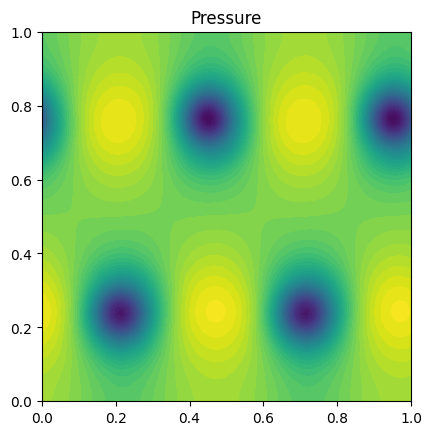

Time t = 2.4085824734166876


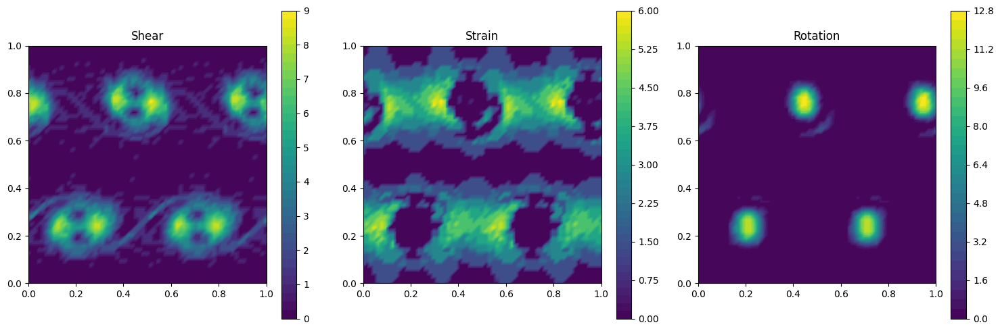

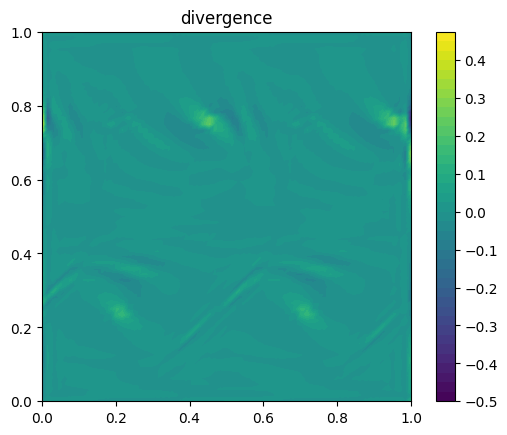

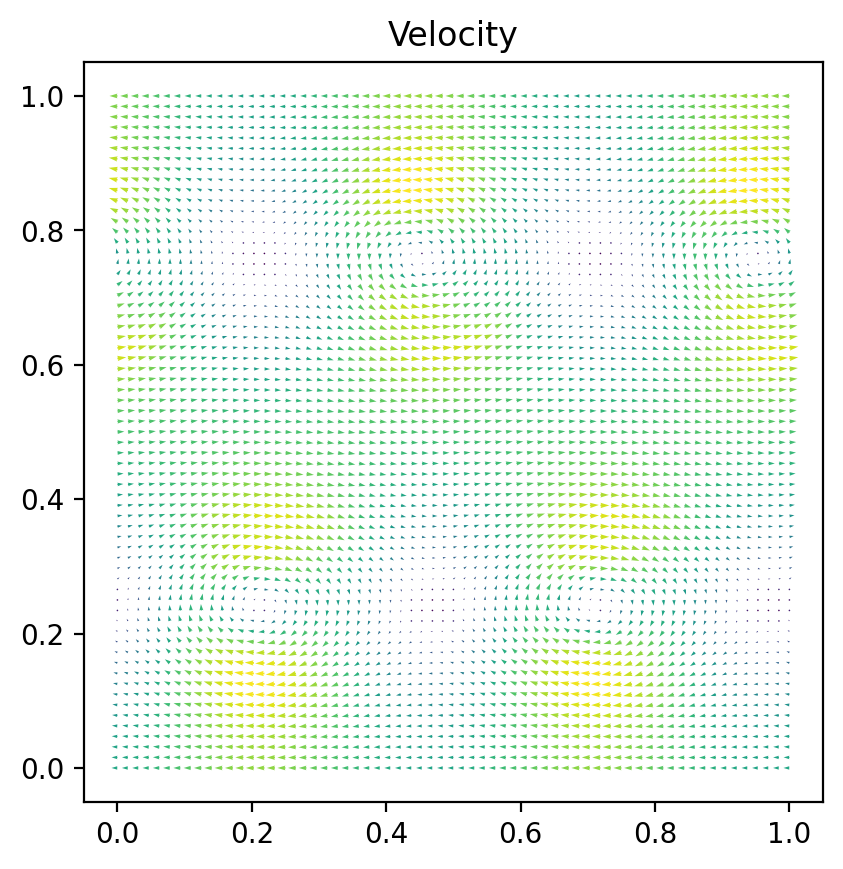

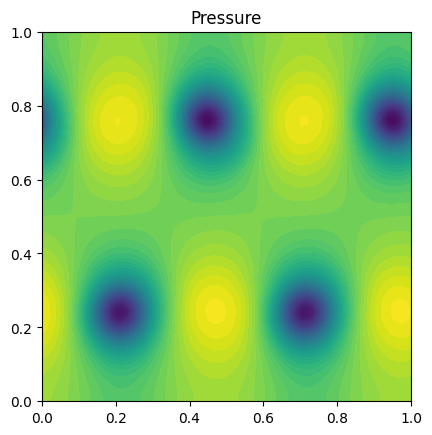

Time t = 2.5080193645210467


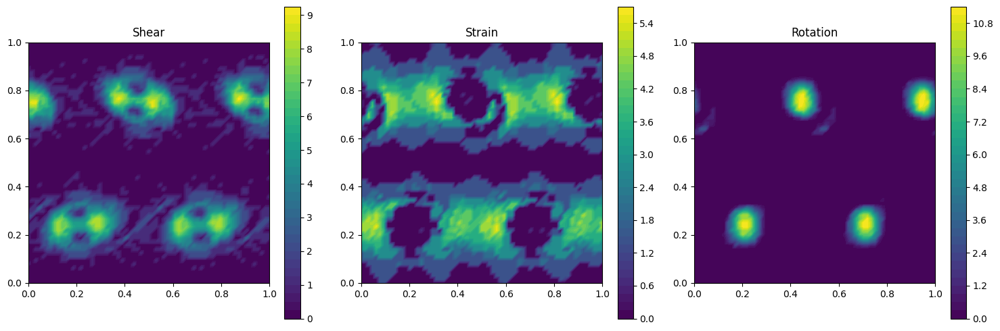

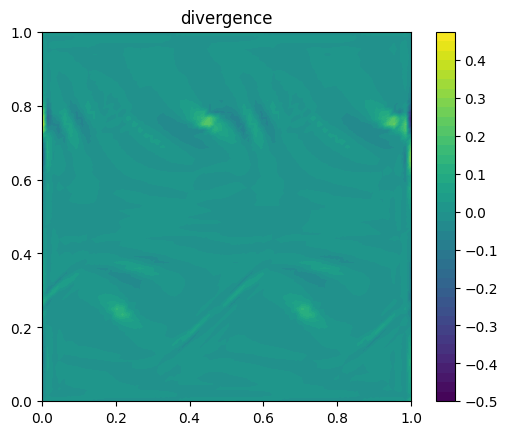

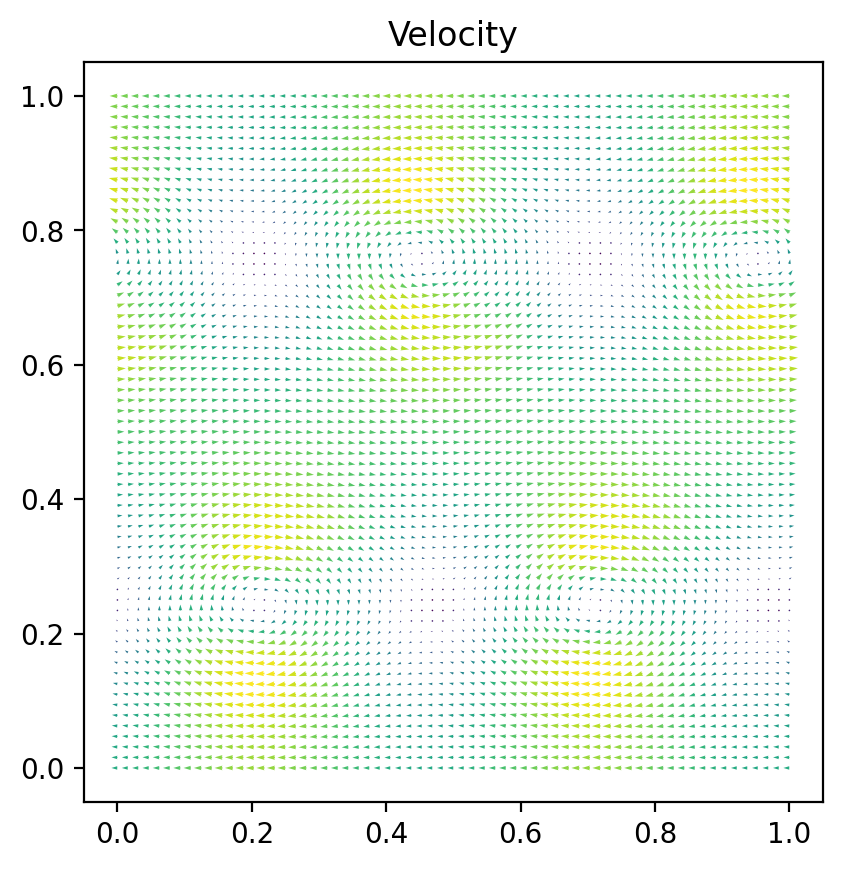

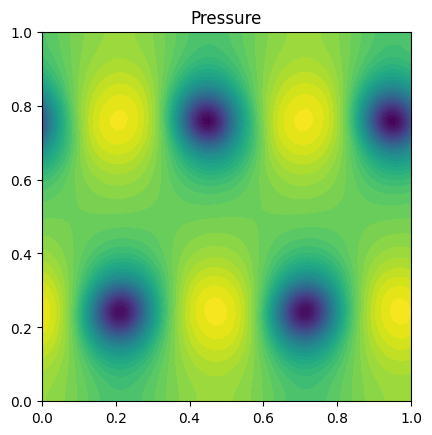

Time t = 2.6074562556254057


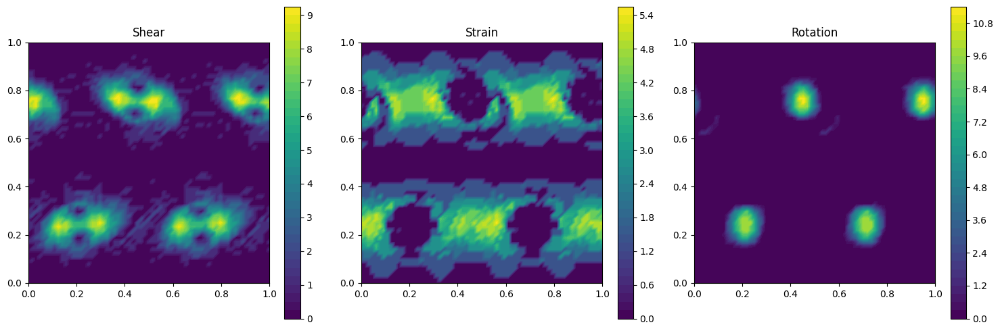

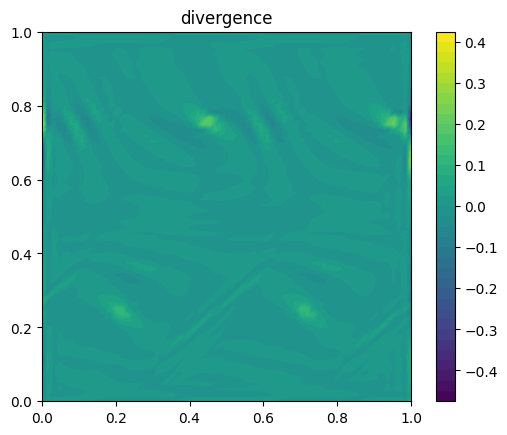

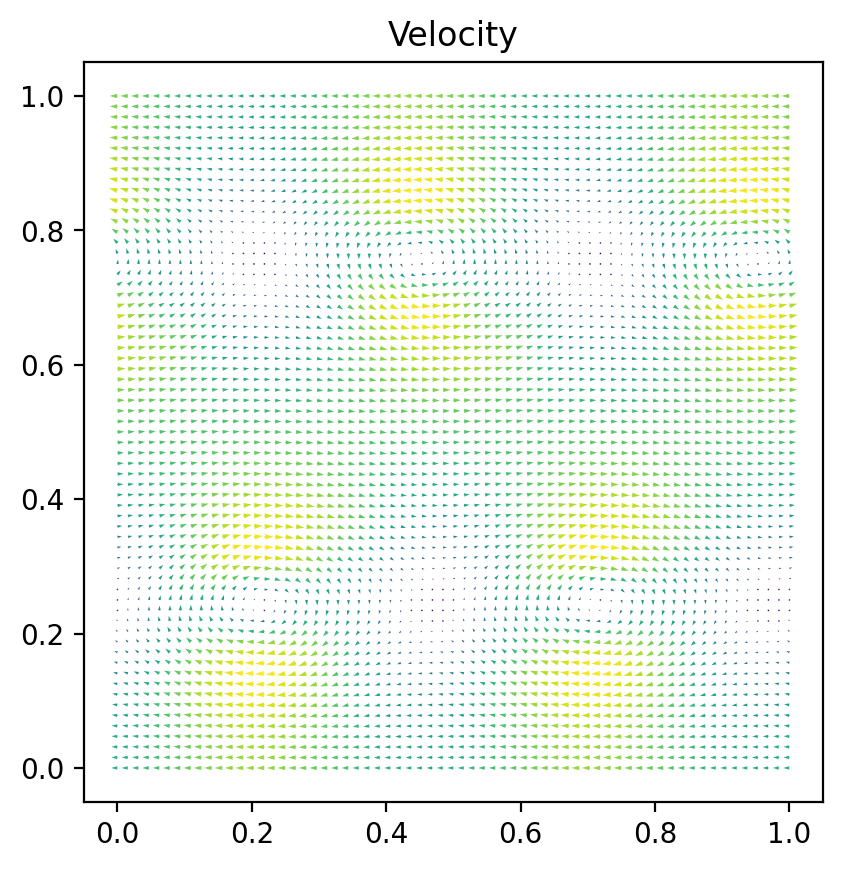

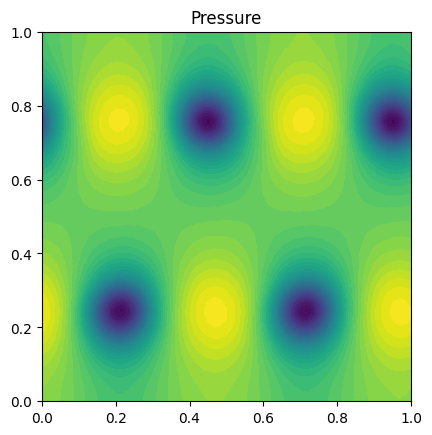

Time t = 2.7068931467297648


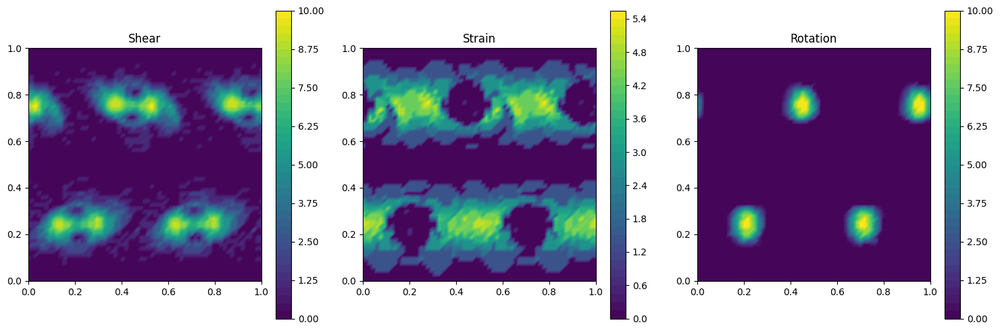

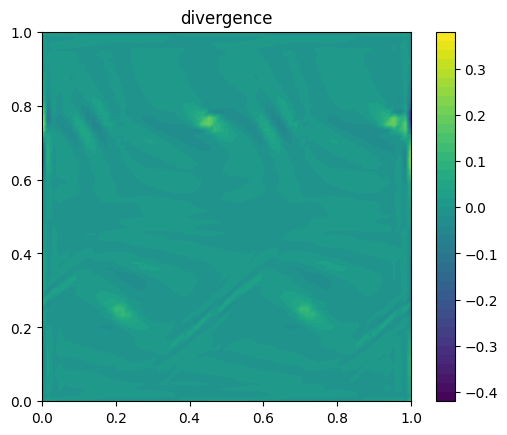

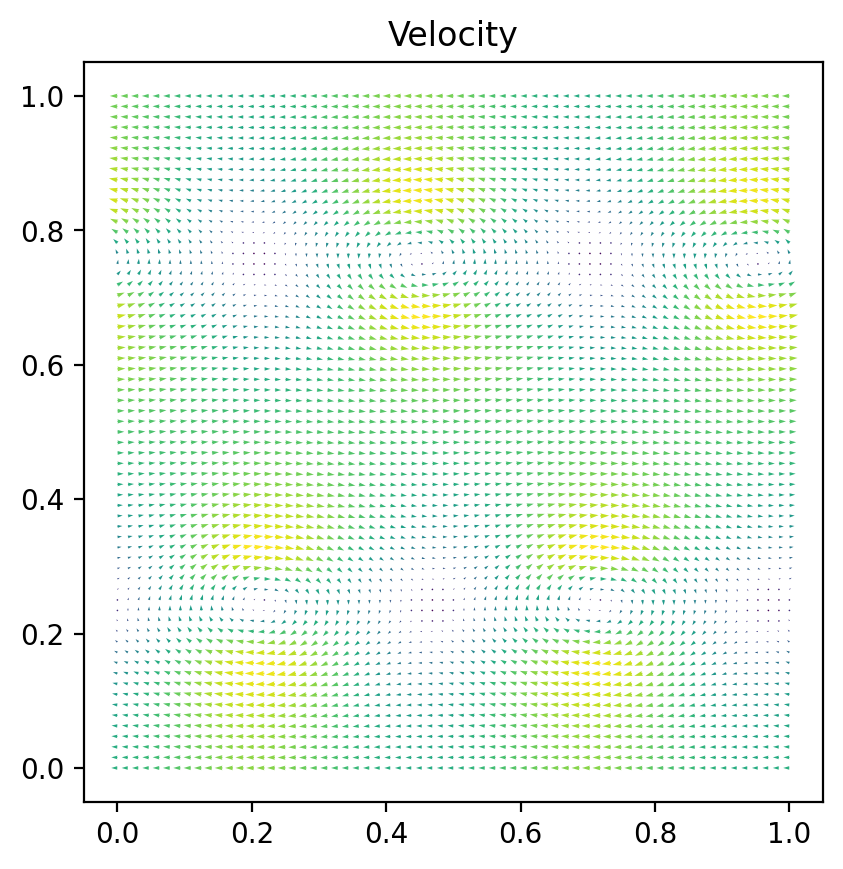

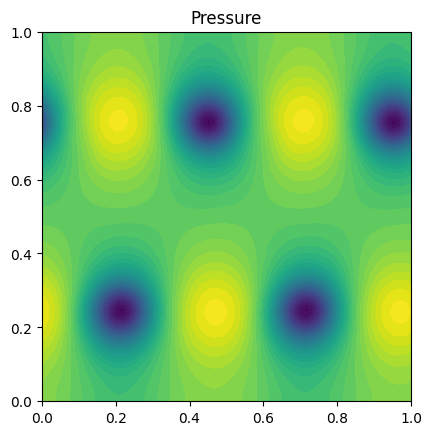

Time t = 2.806330037834124


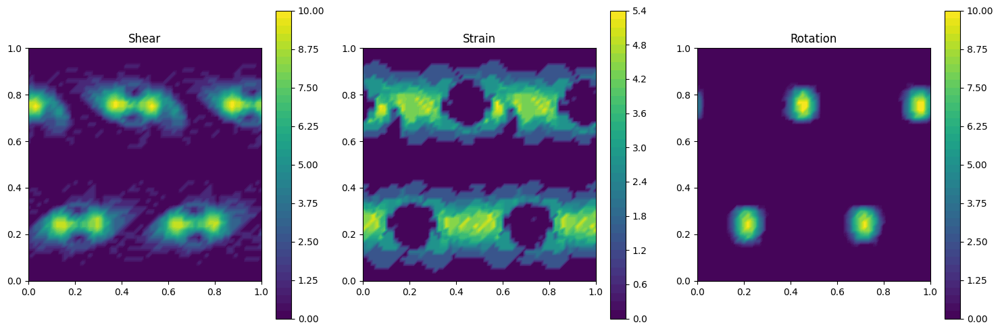

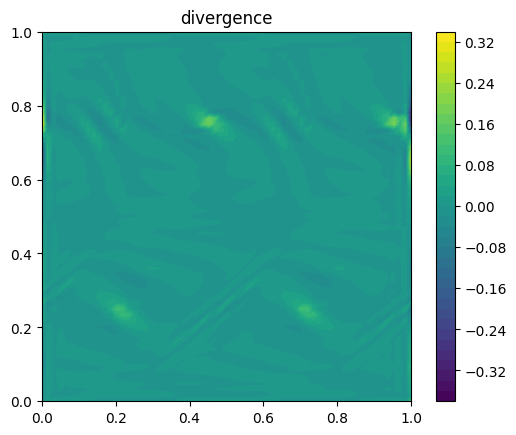

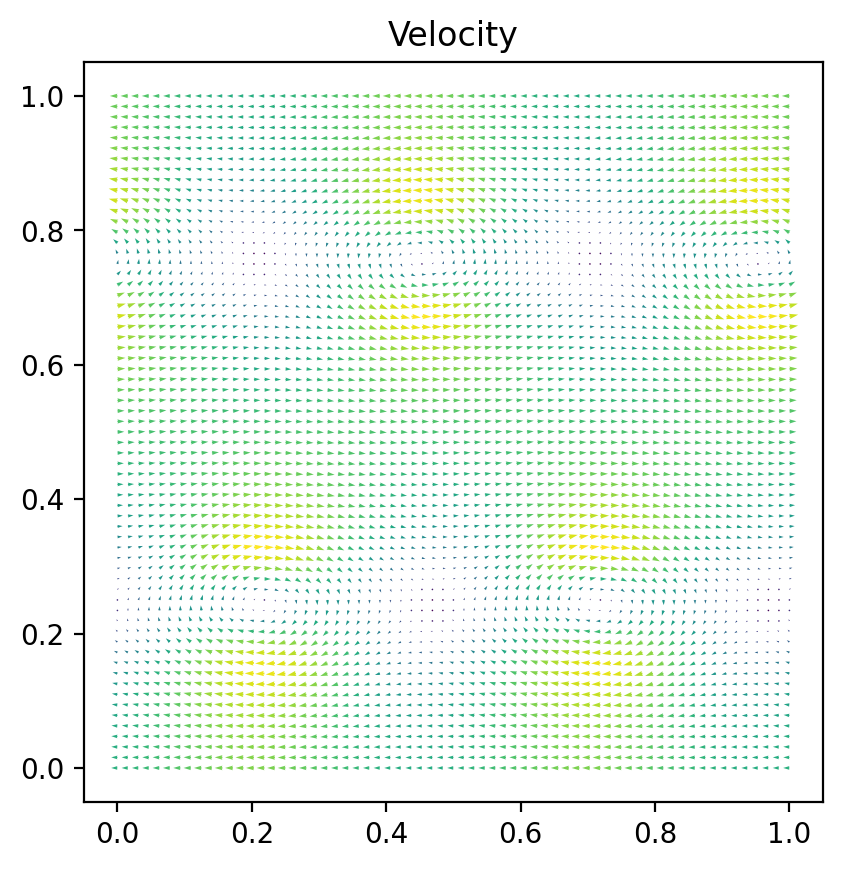

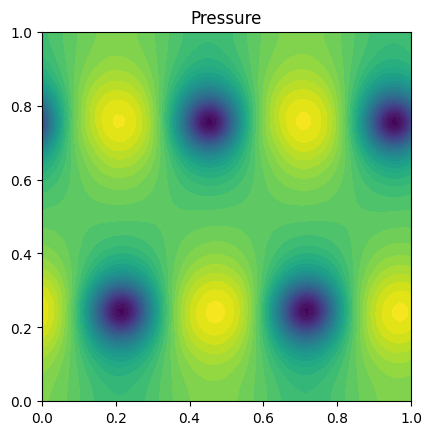

Time t = 2.905766928938483


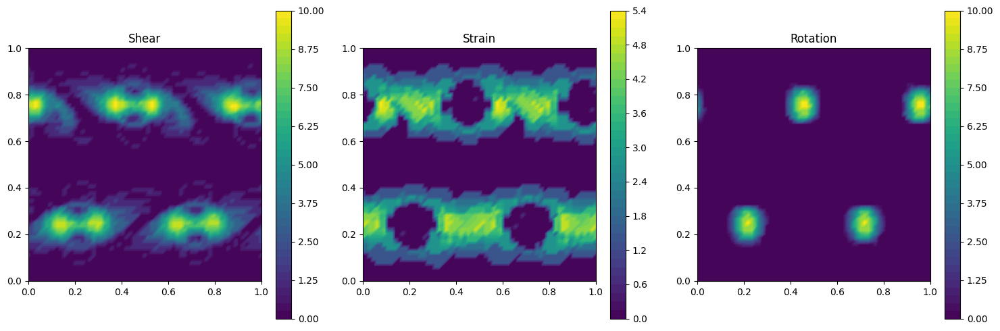

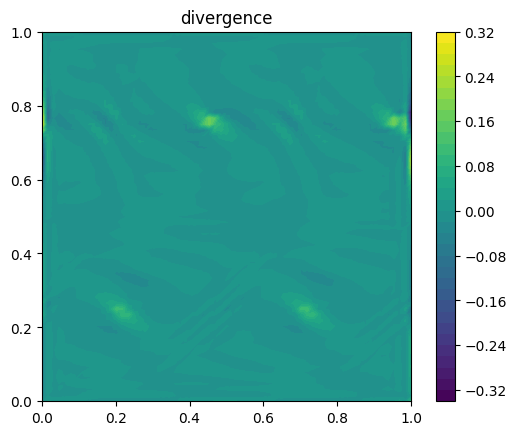

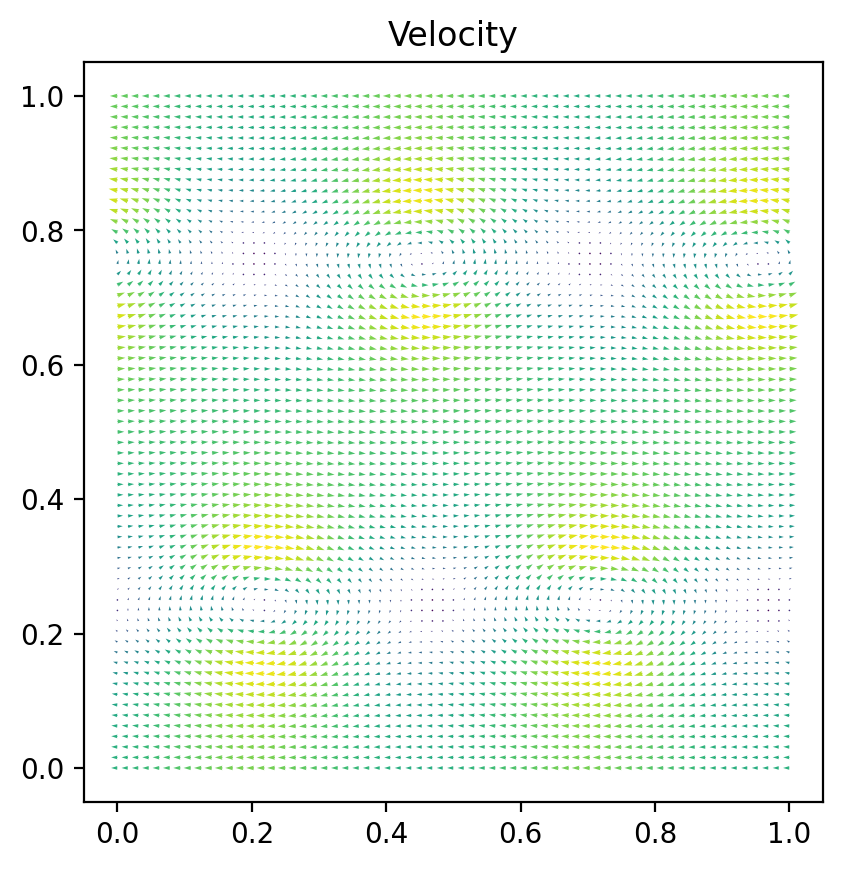

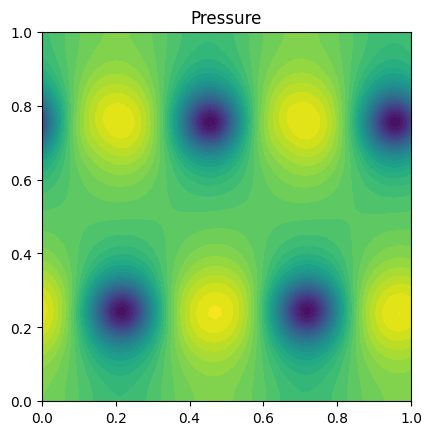

Time t = 3.005203820042842


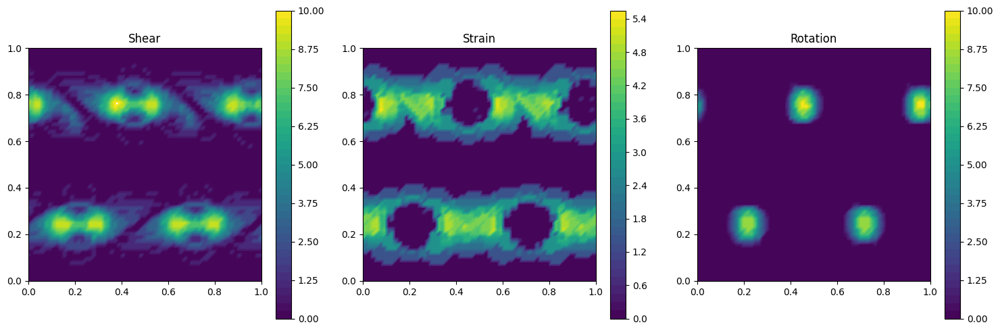

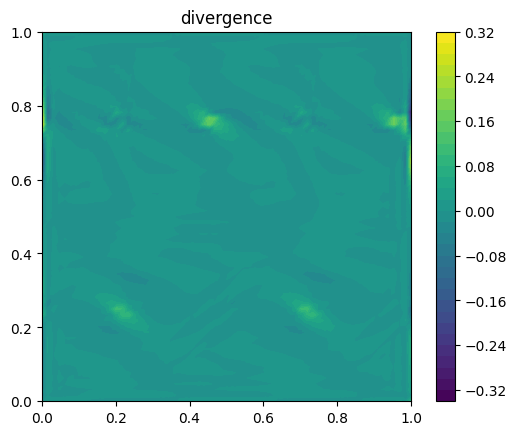

In [ ]:
!rm results-NS/*

# Time stepping
T = 2
t = 0

# Set plot frequency
plot_time = 0
fps = 20
plot_freq = fps * T

plot_realtime = True
plot_vtk = False

while t < T + DOLFIN_EPS:

    #s = 'Time t = ' + repr(t)
    #print(s)

    #pin.t = t
    #uin.t = t

    # Solve non-linear problem
    k = 0
    if t == 0:
        # Plot solution
        plt.figure(dpi=200)
        plot(u0, title="Velocity")

        plt.figure()
        plot(p0, title="Pressure")
        plt.show()
        t += dt

    while k < num_nnlin_iter:

        # Assemble momentum matrix and vector
        Au = assemble(au)
        bu = assemble(Lu)

        # Compute velocity solution
        [bc.apply(Au, bu) for bc in bcu]
        [bc.apply(u1.vector()) for bc in bcu]
        solve(Au, u1.vector(), bu, "bicgstab", "default")

        # Assemble continuity matrix and vector
        Ap = assemble(ap)
        bp = assemble(Lp)

        # Compute pressure solution
        [bc.apply(Ap, bp) for bc in bcp]
        [bc.apply(p1.vector()) for bc in bcp]
        solve(Ap, p1.vector(), bp, "bicgstab", prec)

        k += 1

    if t > plot_time or t == dt:

        s = 'Time t = ' + repr(t)
        print(s)

        if plot_vtk:
            # Save solution to file
            file_u << u1
            file_p << p1

        if plot_realtime:
            # Triple decomposition
            V = TensorFunctionSpace(mesh, 'P', 1)
            grad_u1_prel = nabla_grad(u1)
            grad_u1 = project(grad_u1_prel, V)

            V2 = FunctionSpace(mesh, 'CG', 1)
            shear = Function(V2)
            elongation = Function(V2)
            rotation = Function(V2)
            dofmap = V2.dofmap()

            # Divergence
            divu = Function(V2)

            for vertex in vertices(mesh):
                point = vertex.point()
                grad_u1_point = grad_u1(point) # Evaluate the gradient tensor at the current point
                grad_u1_matrix = matrix = np.array([
                                                    [grad_u1_point[0],grad_u1_point[1] ],
                                                    [grad_u1_point[2], grad_u1_point[3]]
                                                                                          ])
                sh, el, rr = triple_decomposition(grad_u1_matrix)
                vertex_index = vertex.index()
                dof_index = vertex_to_dof_map(V2)[vertex_index]
                shear.vector()[dof_index] = sh
                elongation.vector()[dof_index] = el
                rotation.vector()[dof_index] = rr

                divu_vert = grad_u1_point[0] + grad_u1_point[3]
                divu.vector()[dof_index] = divu_vert

            # Plot Triple Decomposition
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            ax = plt.subplot(1, 3, 1)
            im = plot(shear, title = "Shear")
            plt.colorbar(im)
            ax = plt.subplot(1, 3, 2)
            im = plot(elongation, title = "Strain")
            plt.colorbar(im)
            ax = plt.subplot(1, 3, 3)
            im = plot(rotation, title = "Rotation")
            plt.colorbar(im)
            plt.tight_layout()
            plt.show()

            # Plot divergence
            plt.figure()
            im = plot(divu, title="divergence")
            plt.colorbar(im)

            # Plot solution
            plt.figure(dpi=200)
            plot(u1, title="Velocity")

            plt.figure()
            plot(p1, title="Pressure")
            plt.show()

        plot_time += T/plot_freq



    # Update time step
    u0.assign(u1)
    t += dt


if plot_vtk:
    !tar -czvf results-NS.tar.gz results-NS
    files.download('results-NS.tar.gz')